## Guardians of the Crypto
### A Streamlit Application for Enhanced Price Prediction and Informed Decision-Making
###### by Mirna Philip, Justin Farnan and Arya Shahbazi

###### The cryptocurrency market is very unpredictable, with prices changing a lot in a short time, making it hard for investors and traders to make good decisions. Our project, Guardians of the Crypto, aims to solve this problem by using past price data and sentiment analysis to predict changes in cryptocurrency prices. By combining these methods, we want to create a reliable tool that helps traders and investors understand the market better and make confident decisions. Studies have shown that social media sentiment, especially from platforms like Reddit, can affect cryptocurrency prices. Our main goals are to collect past price data for major cryptocurrencies using the Coinbase API and gather sentiment data from Reddit using natural language processing (NLP) tools. We will clean and prepare this data, analyze Reddit posts to determine market sentiment, and train different machine learning models, including simple models like Linear Regression and advanced ones like Long Short-Term Memory (LSTM) networks, to predict cryptocurrency price changes accurately. We will evaluate these models, improve the best one, and develop a Streamlit application that combines sentiment analysis, past price data, and other trading metrics to help cryptocurrency traders and investors make better decisions in a volatile market.

In [ ]:
#!pip install shap


In [4]:
import pandas as pd
import numpy as np
import requests
from datetime import datetime, timedelta
from dateutil.relativedelta import relativedelta
import pytz
import time
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import GradientBoostingRegressor
#import shap
from extract_coinbase import combine_price_data

#### Data Inspection and Understanding

In [10]:
updated_data = combine_price_data()
updated_data.head()

Missing dates: DatetimeIndex(['2021-07-15', '2022-01-16', '2022-07-16', '2023-01-16',
               '2023-07-16', '2024-01-16'],
              dtype='datetime64[ns]', freq=None)


,time,low,high,open,close,volume,price_change,average_price,volatility,product_id,load_dt
0,2021-07-16,1850.1500,1965.3500,1918.9900,1877.2200,1.842217e+05,-41.7700,1907.75000,6.226522,ETH-USD,2024-07-15
1,2021-07-16,367.1000,410.5000,398.4500,367.8900,2.381554e+04,-30.5600,388.80000,11.822392,COMP-USD,2024-07-15
2,2021-07-16,26.2040,29.4800,28.5750,26.2960,3.369130e+05,-2.2790,27.84200,12.501908,SOL-USD,2024-07-15
3,2021-07-16,15.9297,17.5908,17.0647,16.3449,5.165473e+05,-0.7198,16.76025,10.427692,UNI-USD,2024-07-15
4,2021-07-16,1.1661,1.2452,1.2249,1.1714,3.676491e+07,-0.0535,1.20565,6.783295,ADA-USD,2024-07-15


In [13]:
updated_data.to_csv('RAW_Data/updated_data_715.csv')

In [2]:
updated_data

# Display the first few rows of the dataframe
print("First few rows of the dataset:")
data.head(2)

First few rows of the dataset:


,Unnamed: 0,time,low,high,open,close,volume,price_change,average_price,volatitlity,product_id
0,0,2021-12-27,50480.0,52100.00,50804.33,50717.77,11596.914682,-86.56,51290.000,3.209192,BTC-USD
1,1,2021-12-26,49460.0,51295.33,50428.31,50801.79,6863.394738,373.48,50377.665,3.710736,BTC-USD


In [3]:
def print_dataframe_shape(df, name):
    rows, columns = df.shape
    print(f"{name} database has {rows} rows and {columns} columns.")

print_dataframe_shape(data, "Cryptocurrency")

Cryptocurrency database has 6847 rows and 11 columns.


In [4]:
data['product_id'].value_counts()

product_id
BTC-USD     1084
ETH-USD     1084
SOL-USD     1084
ADA-USD     1084
LINK-USD    1084
LTC-USD     1084
XRP-USD      343
Name: count, dtype: int64

In [6]:
def separateCryptoData(data):
    cryptoDfs = {}
    unique_product_ids = data['product_id'].unique()
    
    for product_id in unique_product_ids:
        cryptoDfs[product_id] = data[data['product_id'] == product_id]
    
    return cryptoDfs

# Example usage
cryptoDfs = separateCryptoData(data)

# Access individual DataFrames
SOLdf = cryptoDfs.get('SOL-USD')
BTCdf = cryptoDfs.get('BTC-USD')
ETHdf = cryptoDfs.get('ETH-USD')
ADAdf = cryptoDfs.get('ADA-USD')
LINKdf = cryptoDfs.get('LINK-USD')
LTCdf = cryptoDfs.get('LTC-USD')
XRPdf = cryptoDfs.get('XRP-USD')


In [7]:
# Display basic information about the dataframe
def basicInformation(name, cryptoDfs):
    print(f"\nBasic information about the {name}:")
    cryptoDfs.info()
    print("\n" + "="*50 + "\n")
    
cryptos_info = {
    'SOL': SOLdf,
    'BTC': BTCdf,
    'ETH': ETHdf,
    'ADA': ADAdf,
    'LINK': LINKdf,
    'LTC': LTCdf,
    'XRP': XRPdf
}

for name, df in cryptos_info.items():
    basicInformation(name, df)


Basic information about the SOL:
<class 'pandas.core.frame.DataFrame'>
Index: 1084 entries, 366 to 6146
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Unnamed: 0     1084 non-null   int64  
 1   time           1084 non-null   object 
 2   low            1084 non-null   float64
 3   high           1084 non-null   float64
 4   open           1084 non-null   float64
 5   close          1084 non-null   float64
 6   volume         1084 non-null   float64
 7   price_change   1084 non-null   float64
 8   average_price  1084 non-null   float64
 9   volatitlity    1084 non-null   float64
 10  product_id     1084 non-null   object 
dtypes: float64(8), int64(1), object(2)
memory usage: 101.6+ KB



Basic information about the BTC:
<class 'pandas.core.frame.DataFrame'>
Index: 1084 entries, 0 to 5796
Data columns (total 11 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  


In [10]:
# Display summary statistics for the numerical columns
def summaryStatistics(name, cryptoData):
    print(f"\nSummary statistics for the {name}:")
    print(cryptoData.describe())
    print("\n" + "="*50 + "\n")
    
for name, df in cryptos_info.items():
    summaryStatistics(name, df)


Summary statistics for the SOL:
        Unnamed: 0          low         high         open        close  \
count  1084.000000  1084.000000  1084.000000  1084.000000  1084.000000   
mean   3188.269373    71.014211    77.683851    74.344883    74.466090   
std    1894.328460    58.443274    63.907216    61.320405    61.363242   
min     366.000000     8.000000    10.080000     9.640000     9.640000   
25%    1547.750000    22.480000    24.127500    23.252500    23.262500   
50%    2725.500000    39.313000    42.895000    41.028000    41.096000   
75%    4811.250000   108.292500   118.782500   112.735000   112.952500   
max    6146.000000   245.800000   260.000000   258.764000   258.763000   

             volume  price_change  average_price  volatitlity  
count  1.084000e+03   1084.000000    1084.000000  1084.000000  
mean   1.706123e+06      0.121208      74.349031     9.231813  
std    1.451483e+06      5.156981      61.132184     6.625408  
min    1.876976e+05    -26.140000       9.44

In [11]:
# Check for missing values
def checkMissingValues(name, cryptoData):
    print(f"\nMissing values in the {name}:")
    print(cryptoData.isnull().sum())
    print("\n" + "="*50 + "\n")

for name, df in cryptos_info.items():
    checkMissingValues(name, df)


Missing values in the SOL:
Unnamed: 0       0
time             0
low              0
high             0
open             0
close            0
volume           0
price_change     0
average_price    0
volatitlity      0
product_id       0
dtype: int64



Missing values in the BTC:
Unnamed: 0       0
time             0
low              0
high             0
open             0
close            0
volume           0
price_change     0
average_price    0
volatitlity      0
product_id       0
dtype: int64



Missing values in the ETH:
Unnamed: 0       0
time             0
low              0
high             0
open             0
close            0
volume           0
price_change     0
average_price    0
volatitlity      0
product_id       0
dtype: int64



Missing values in the ADA:
Unnamed: 0       0
time             0
low              0
high             0
open             0
close            0
volume           0
price_change     0
average_price    0
volatitlity      0
product_id       0
dtype: 

In [12]:
def checkDuplicateValues(name, cryptoData):
    print(f"\nDuplicate values in the {name}:")
    print(cryptoData.duplicated().sum())
    print("\n" + "="*50 + "\n")

for name, df in cryptos_info.items():
    checkDuplicateValues(name, df)


Duplicate values in the SOL:
0



Duplicate values in the BTC:
0



Duplicate values in the ETH:
0



Duplicate values in the ADA:
0



Duplicate values in the LINK:
0



Duplicate values in the LTC:
0



Duplicate values in the XRP:
0




In [15]:
# Check the distribution of product IDs
def checkProductIDDistribution(name, data):
    print(f"\nDistribution of product IDs for {name}:")
    print(data['product_id'].value_counts())
    print("\n" + "="*50 + "\n")

for name, df in cryptos_info.items():
    checkProductIDDistribution(name, df)


Distribution of product IDs for SOL:
product_id
SOL-USD    1084
Name: count, dtype: int64



Distribution of product IDs for BTC:
product_id
BTC-USD    1084
Name: count, dtype: int64



Distribution of product IDs for ETH:
product_id
ETH-USD    1084
Name: count, dtype: int64



Distribution of product IDs for ADA:
product_id
ADA-USD    1084
Name: count, dtype: int64



Distribution of product IDs for LINK:
product_id
LINK-USD    1084
Name: count, dtype: int64



Distribution of product IDs for LTC:
product_id
LTC-USD    1084
Name: count, dtype: int64



Distribution of product IDs for XRP:
product_id
XRP-USD    343
Name: count, dtype: int64




#### Exploratory Data Analysis (EDA)

In [17]:
# Convert 'time' column to datetime
def convertTimeToDatetime(name, cryptoData):
    cryptoData.loc[:, 'time'] = pd.to_datetime(cryptoData['time'])
    print(f"\nConverted 'time' column to datetime for {name}:")
    print(cryptoData.head())
    print("\n" + "="*50 + "\n")

for name, df in cryptos_info.items():
    convertTimeToDatetime(name, df)


Converted 'time' column to datetime for SOL:
     Unnamed: 0       time     low    high    open   close       volume  \
366         366 2021-12-27  194.83  204.90  198.00  195.74   684157.580   
367         367 2021-12-26  190.31  200.69  193.10  198.00   651526.772   
368         368 2021-12-25  189.26  195.50  190.66  193.06   728943.776   
369         369 2021-12-24  184.10  197.59  190.11  190.65  1139099.939   
370         370 2021-12-23  175.66  193.76  178.45  190.07  1203505.033   

     price_change  average_price  volatitlity product_id  
366         -2.26        199.865     5.168609    SOL-USD  
367          4.90        195.500     5.454259    SOL-USD  
368          2.40        192.380     3.297052    SOL-USD  
369          0.54        190.845     7.327539    SOL-USD  
370         11.62        184.710    10.303996    SOL-USD  



Converted 'time' column to datetime for BTC:
   Unnamed: 0       time       low      high      open     close  \
0           0 2021-12-27  50480.0

In [18]:
# Descriptive Statistics
def descriptiveStatistics(name, cryptoData):
    print(f"\nDescriptive statistics for the {name}:")
    print(cryptoData.describe())
    print("\n" + "="*50 + "\n")

for name, df in cryptos_info.items():
    descriptiveStatistics(name, df)


Descriptive statistics for the SOL:
        Unnamed: 0                           time          low         high  \
count  1084.000000                           1084  1084.000000  1084.000000   
mean   3188.269373  2022-12-23 23:34:45.608856064    71.014211    77.683851   
min     366.000000            2021-06-28 00:00:00     8.000000    10.080000   
25%    1547.750000            2022-03-26 18:00:00    22.480000    24.127500   
50%    2725.500000            2022-12-23 12:00:00    39.313000    42.895000   
75%    4811.250000            2023-09-22 06:00:00   108.292500   118.782500   
max    6146.000000            2024-06-20 00:00:00   245.800000   260.000000   
std    1894.328460                            NaN    58.443274    63.907216   

              open        close        volume  price_change  average_price  \
count  1084.000000  1084.000000  1.084000e+03   1084.000000    1084.000000   
mean     74.344883    74.466090  1.706123e+06      0.121208      74.349031   
min       9.64000

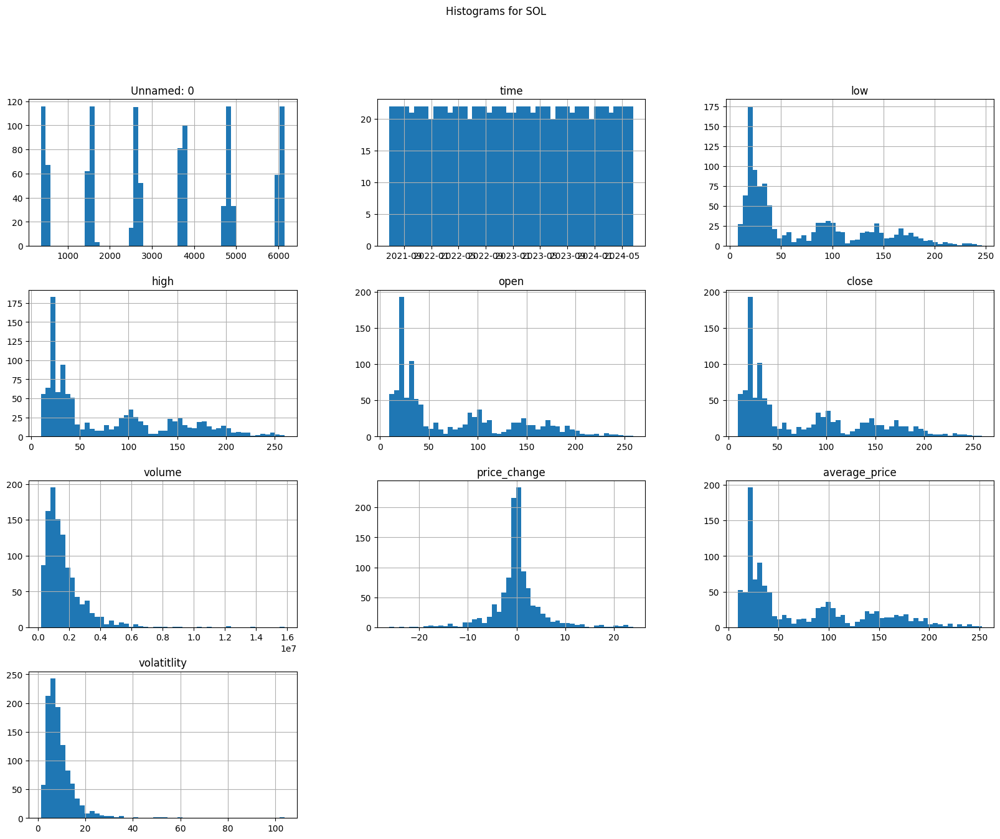

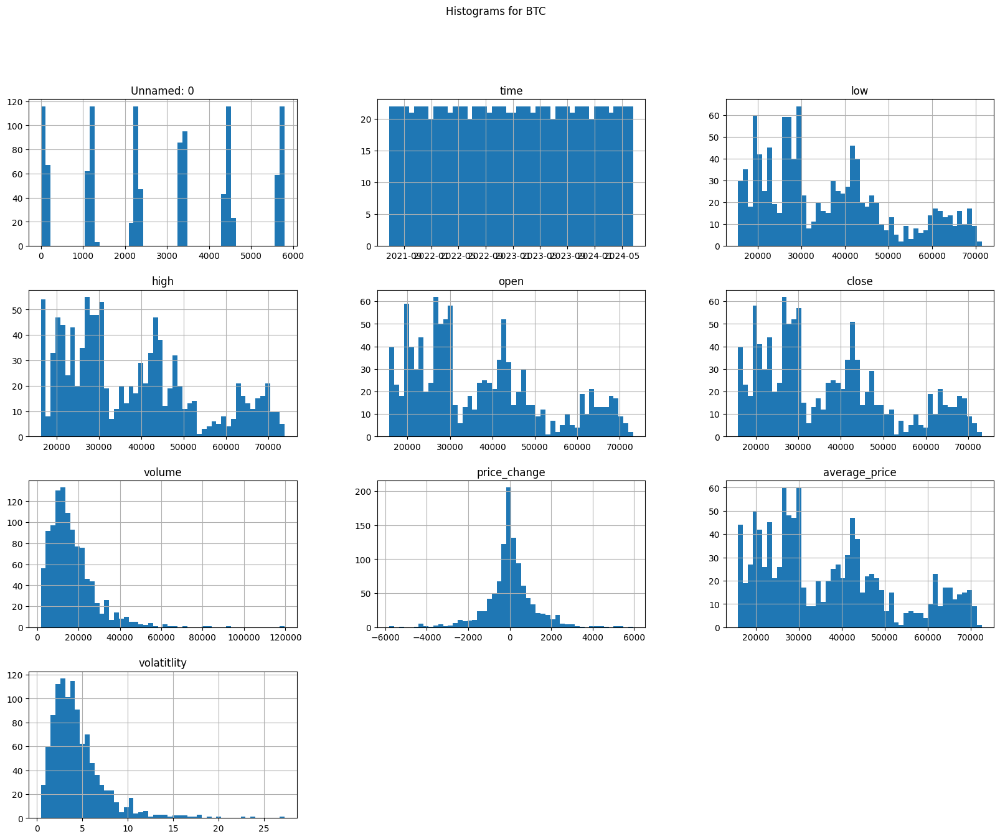

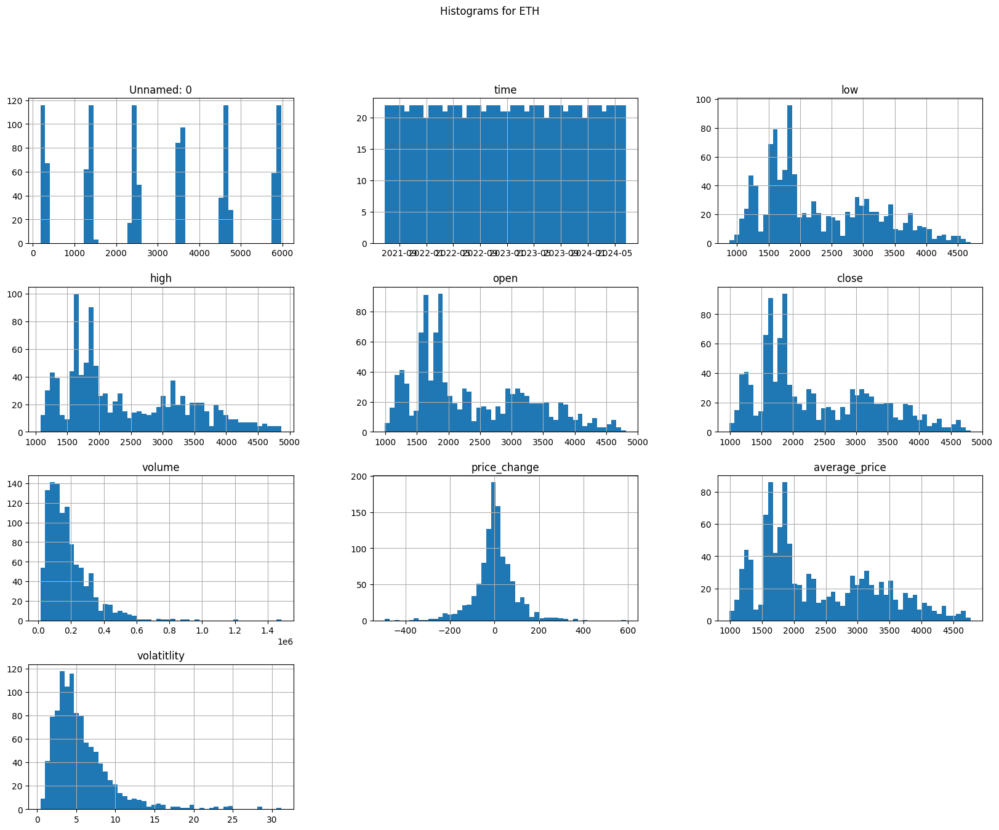

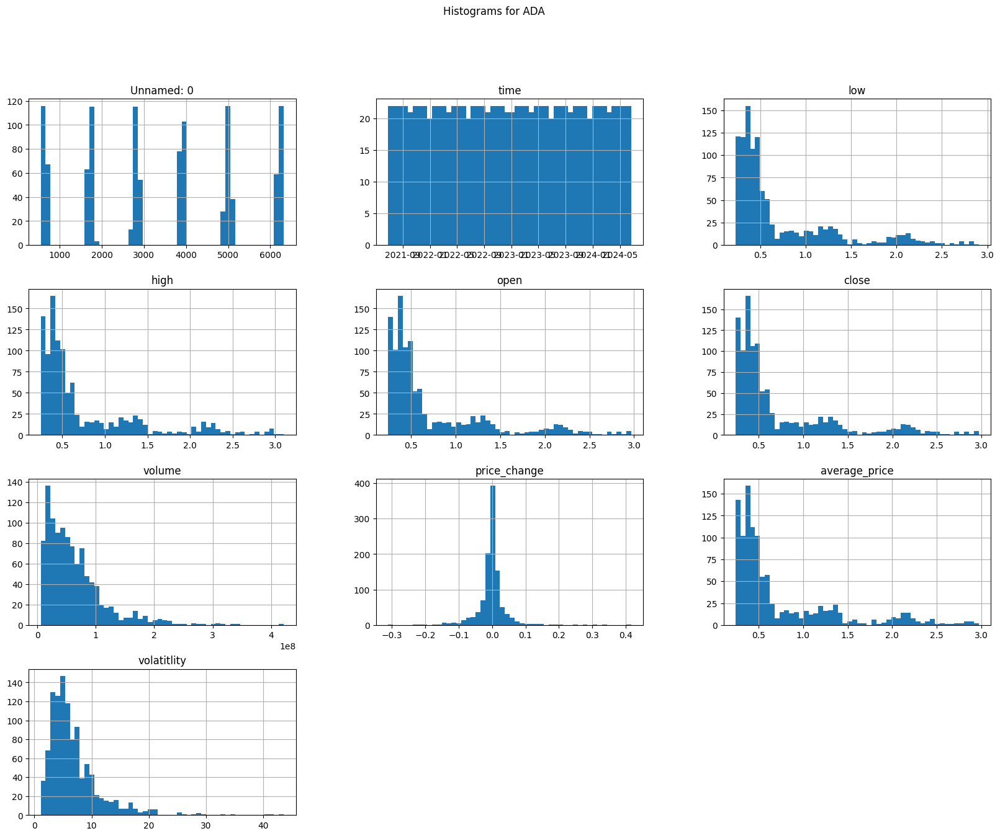

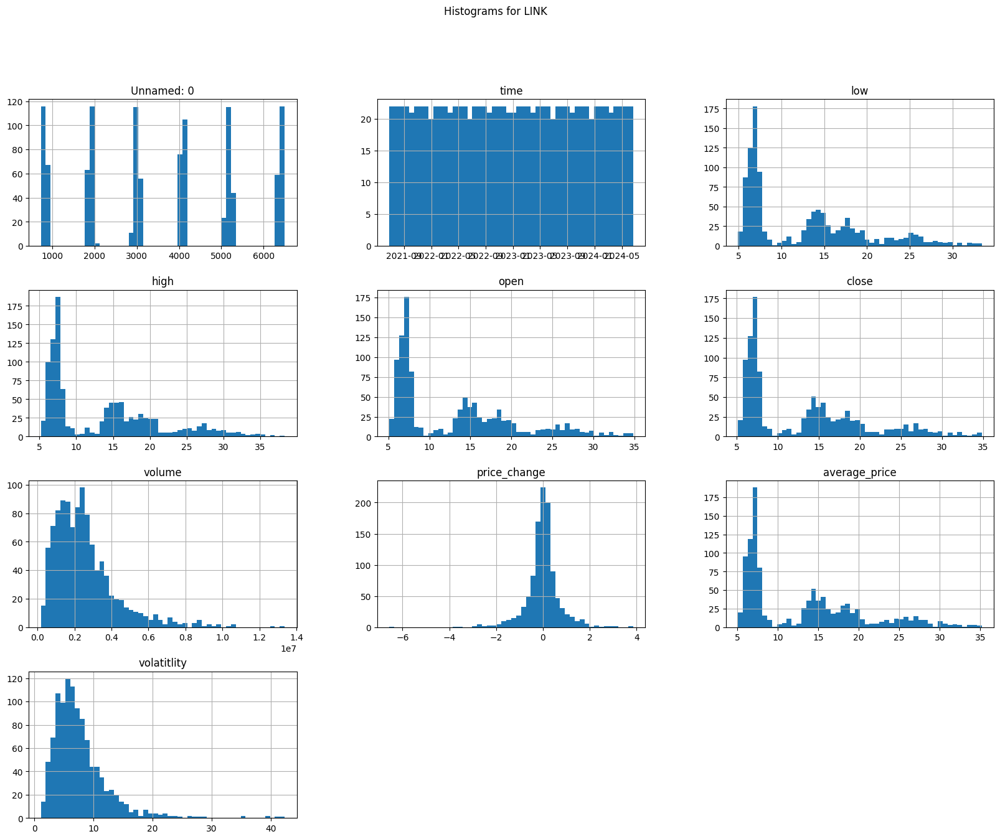

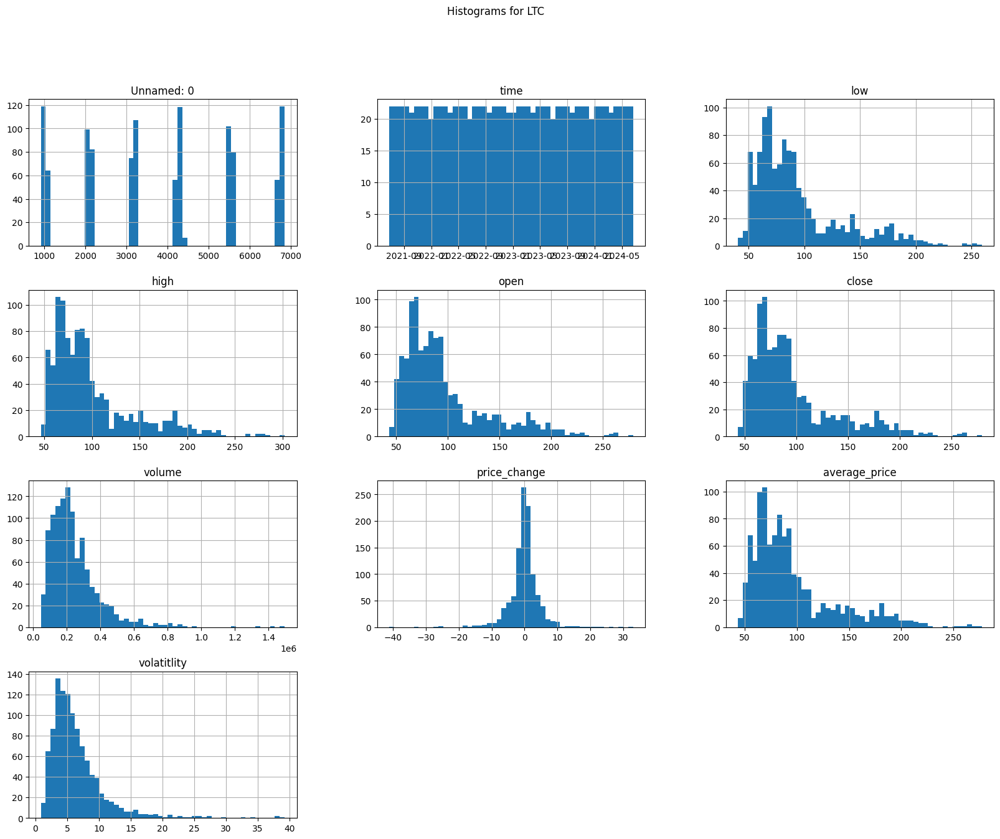

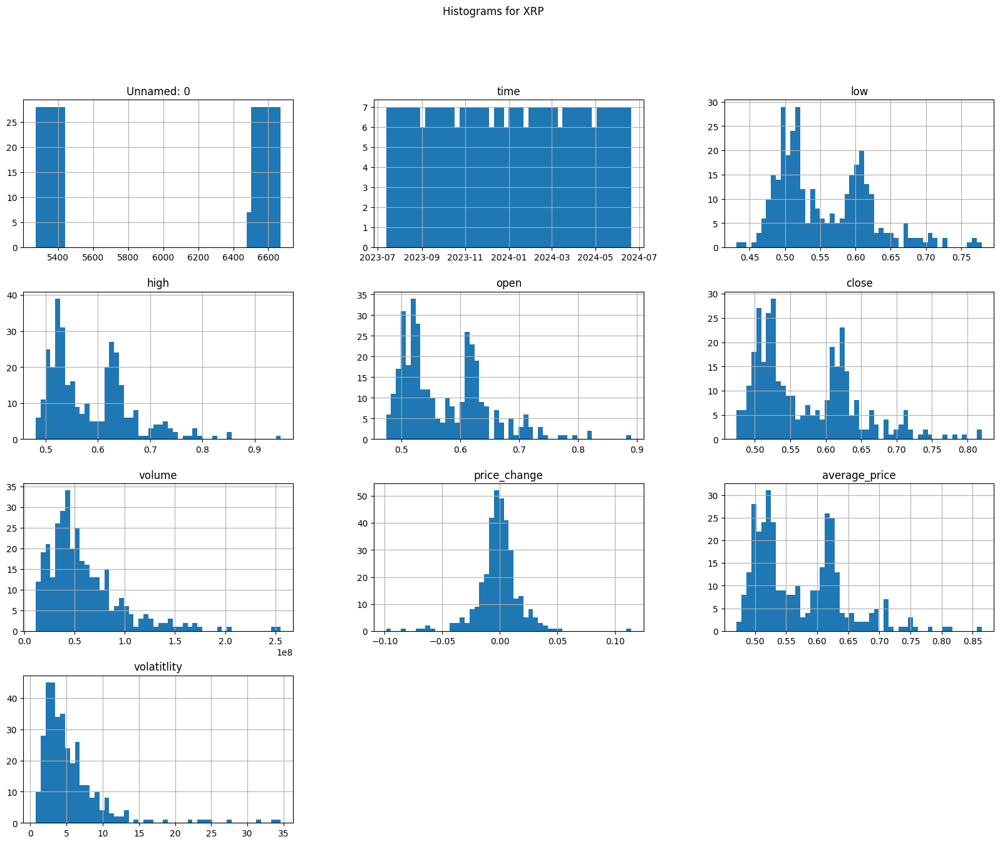

In [19]:
# Histograms
def plotHistograms(name, cryptoData):
    cryptoData.hist(bins=50, figsize=(20, 15))
    plt.suptitle(f'Histograms for {name}')
    plt.show()

for name, df in cryptos_info.items():
    plotHistograms(name, df)

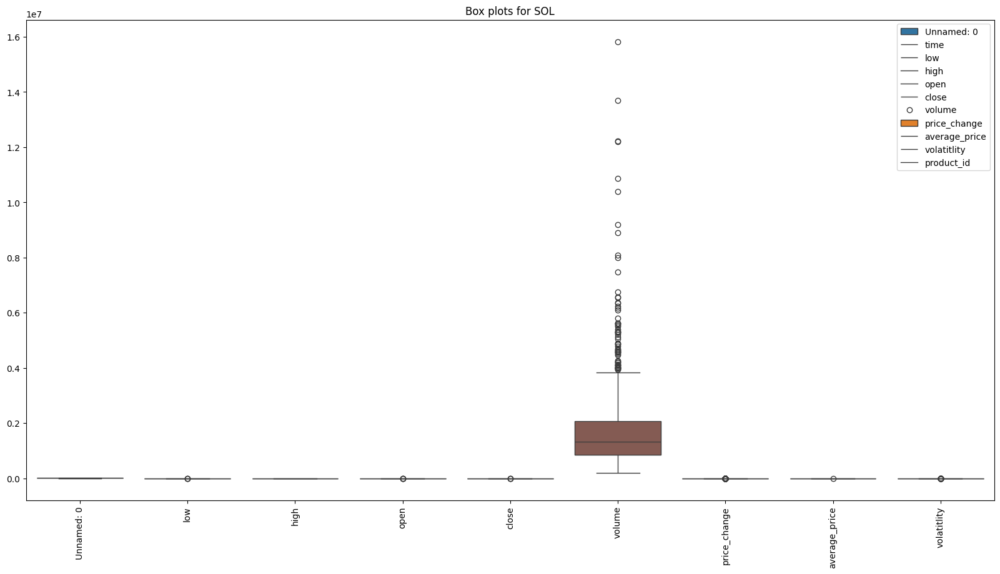

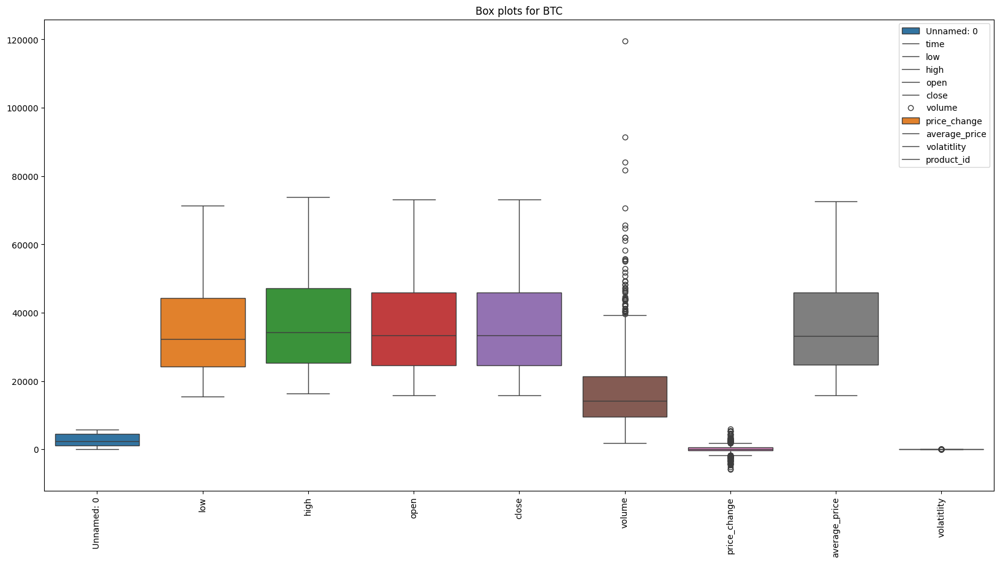

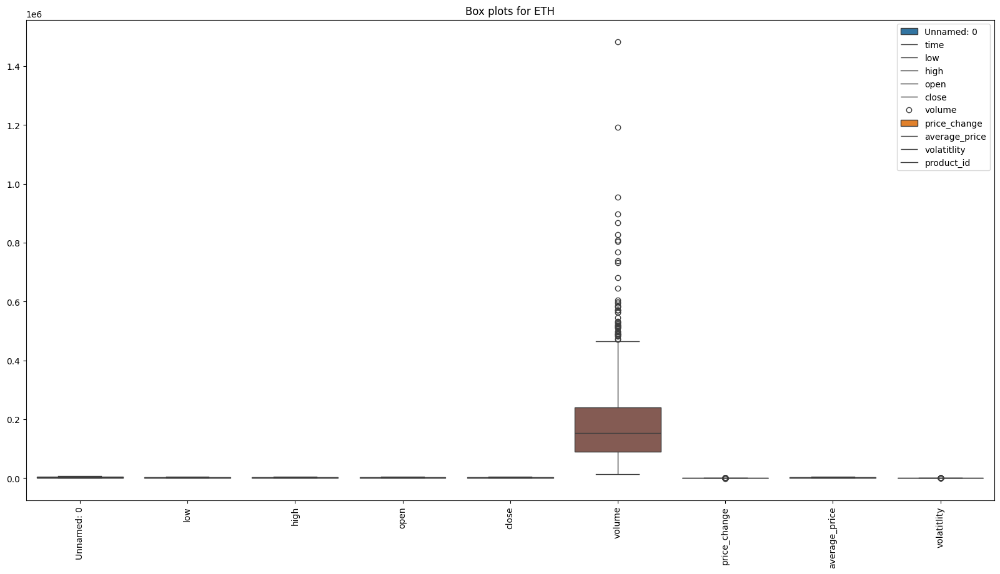

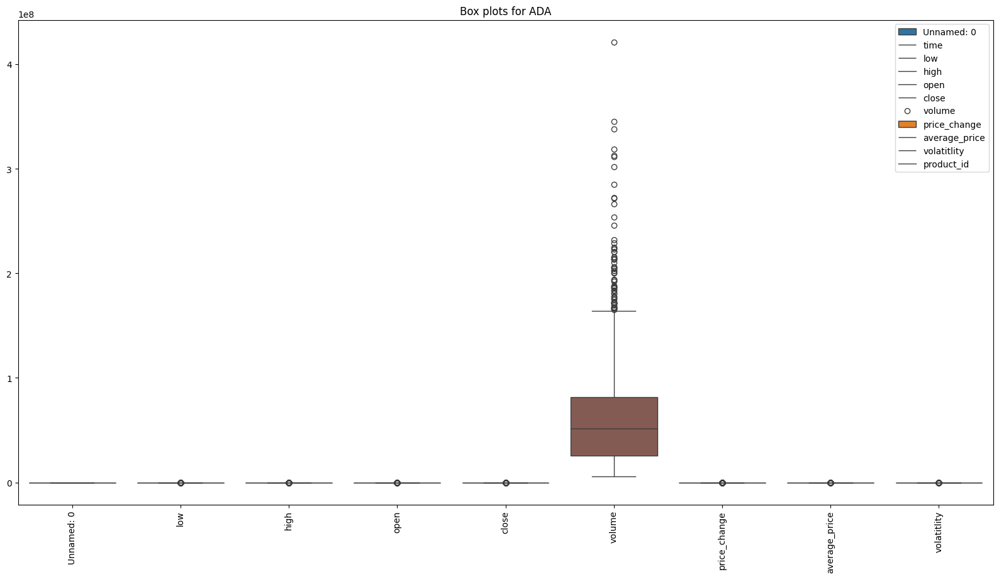

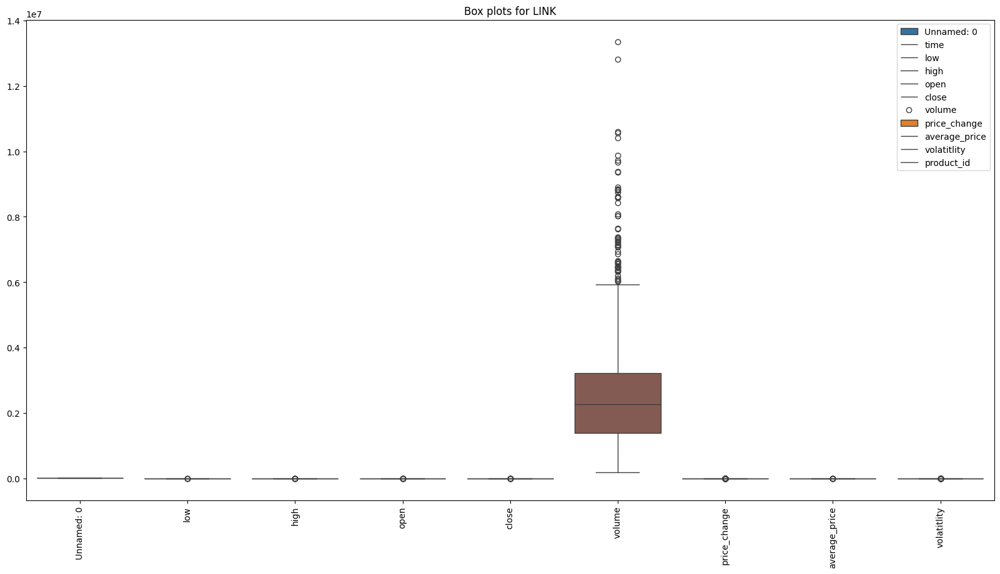

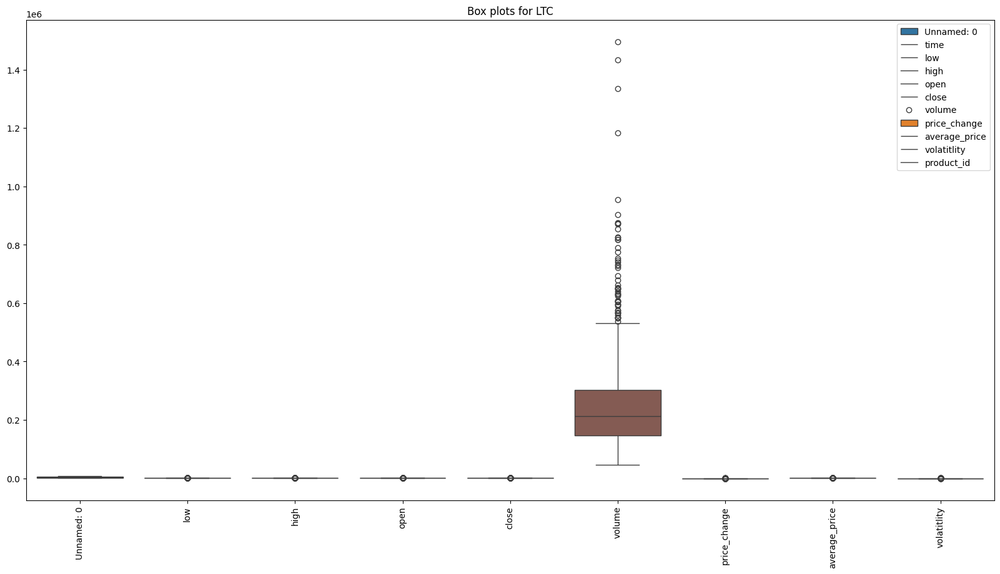

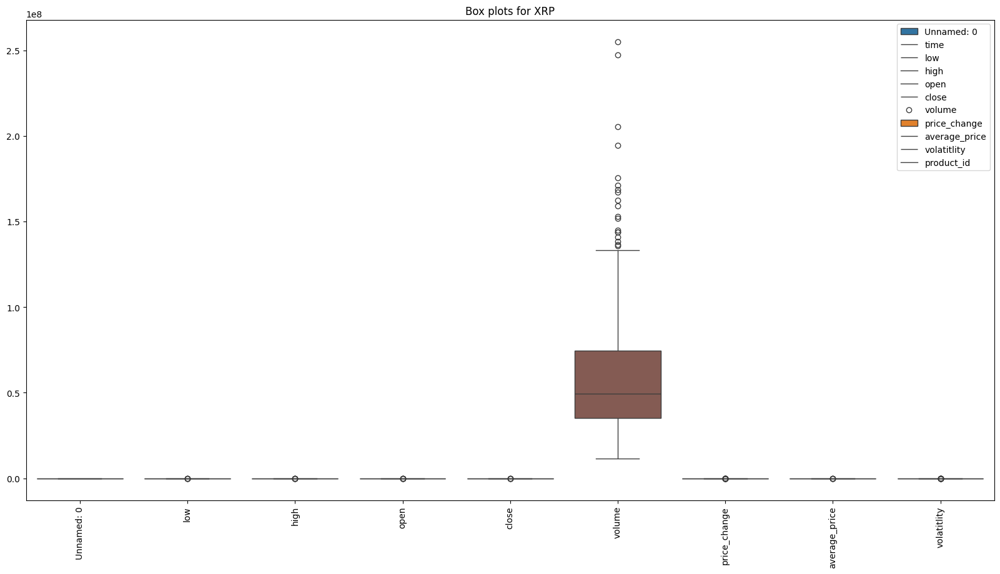

In [20]:
# Box plots
def plotBoxPlots(name, cryptoData):
    plt.figure(figsize=(20, 10))
    sns.boxplot(data=cryptoData)
    plt.title(f'Box plots for {name}')
    plt.xticks(rotation=90)
    plt.legend(labels=cryptoData.columns)
    plt.show()
    
for name, df in cryptos_info.items():
    plotBoxPlots(name, df)

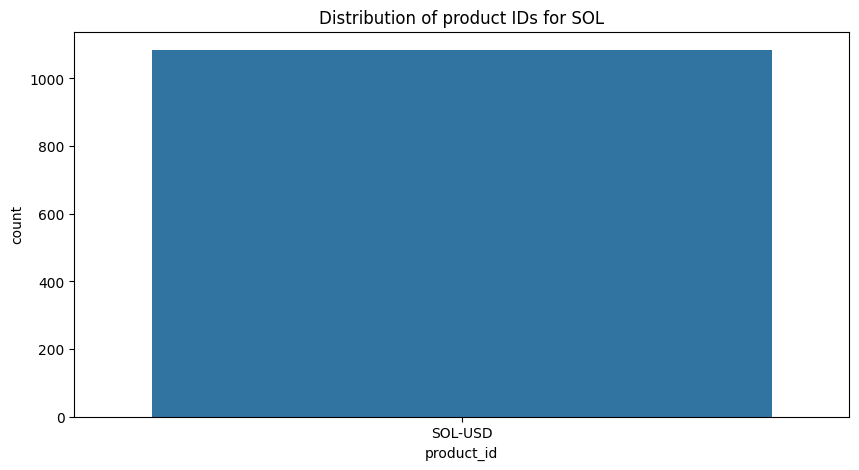

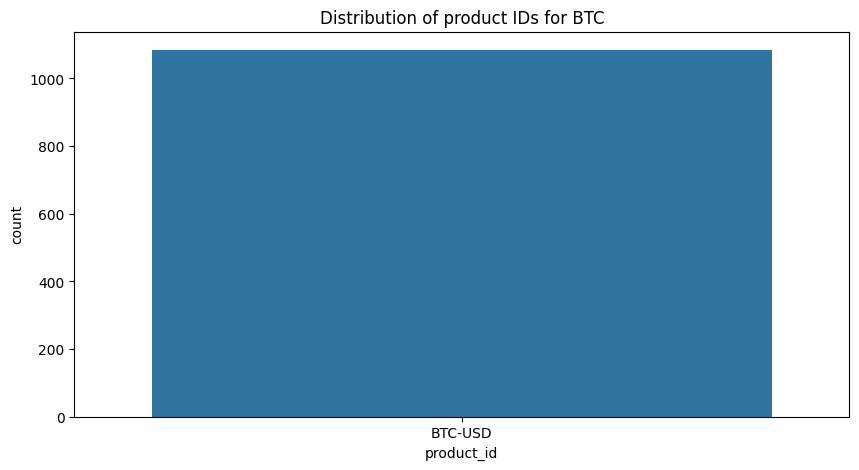

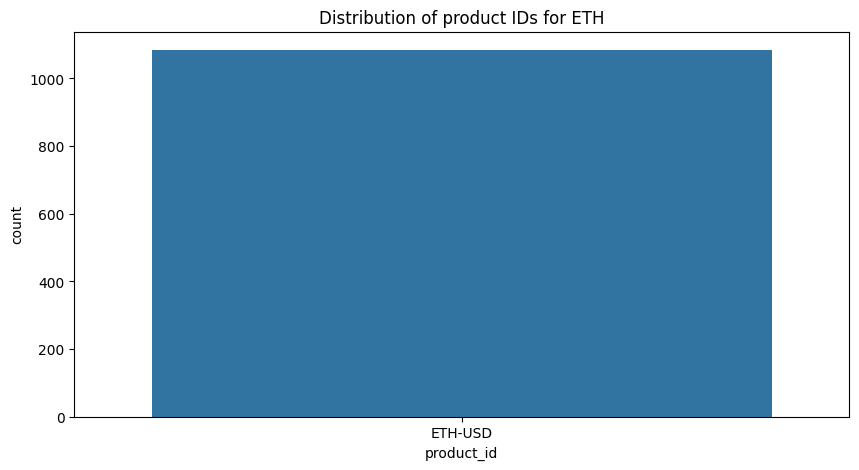

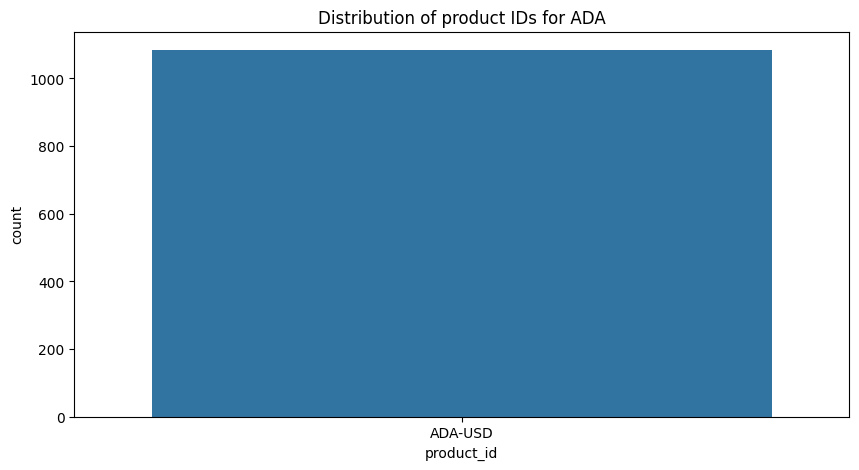

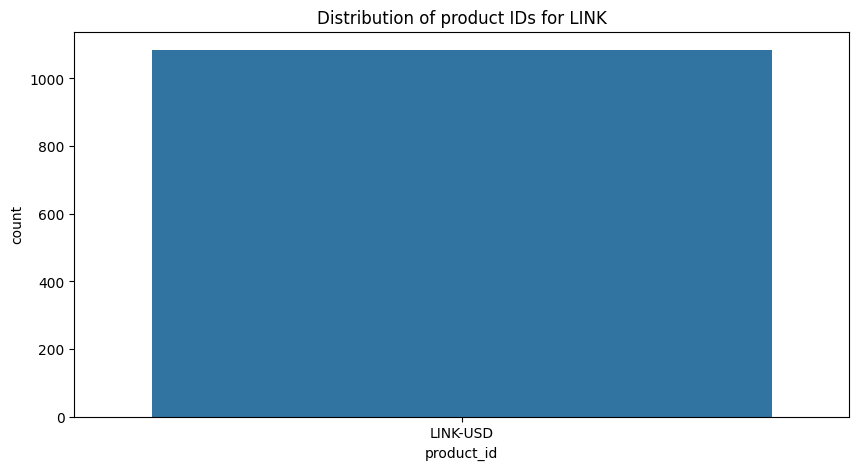

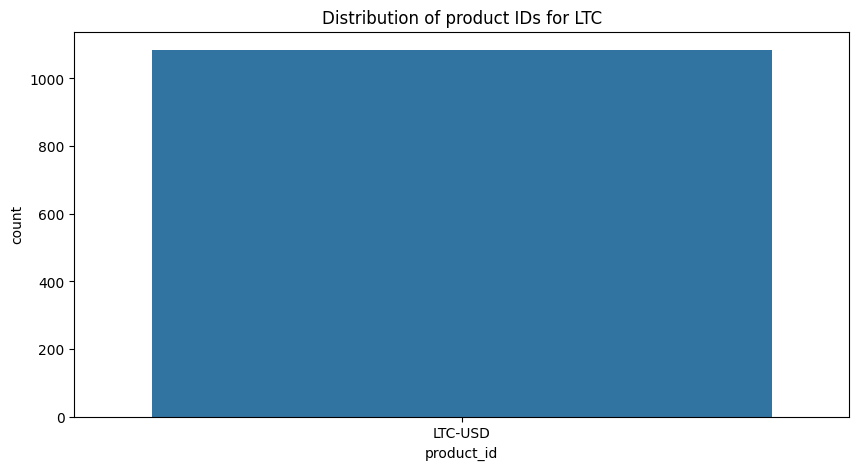

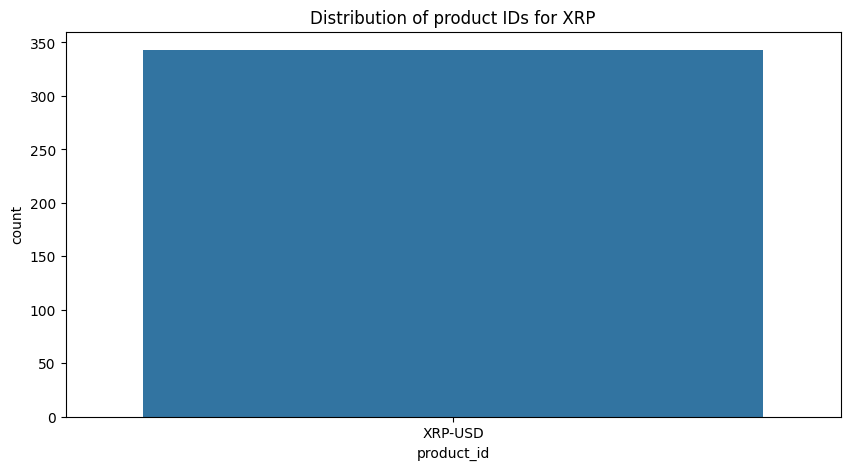

In [21]:
# Distribution of product IDs
def plotProductIDDistribution(name, data):
    plt.figure(figsize=(10, 5))
    sns.countplot(x='product_id', data=data)
    plt.title(f'Distribution of product IDs for {name}')
    plt.show()
    
for name, df in cryptos_info.items():
    plotProductIDDistribution(name, df)

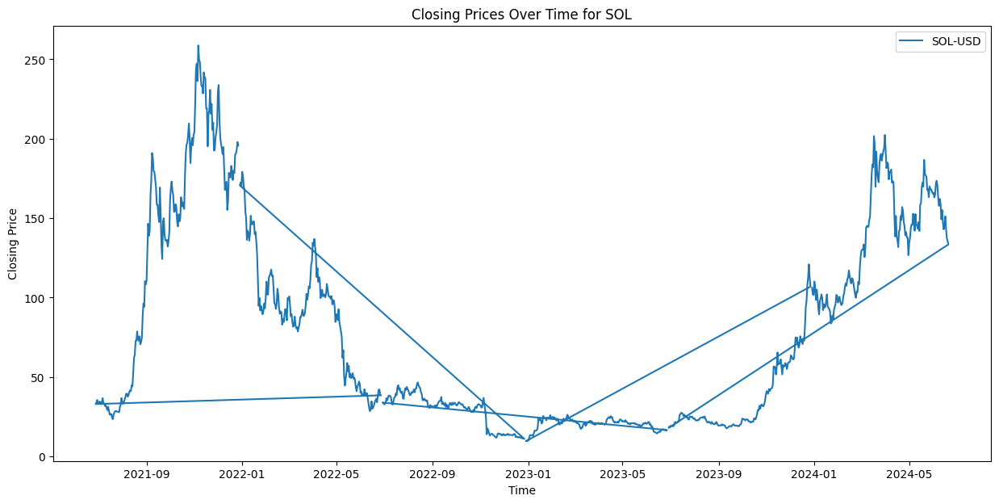

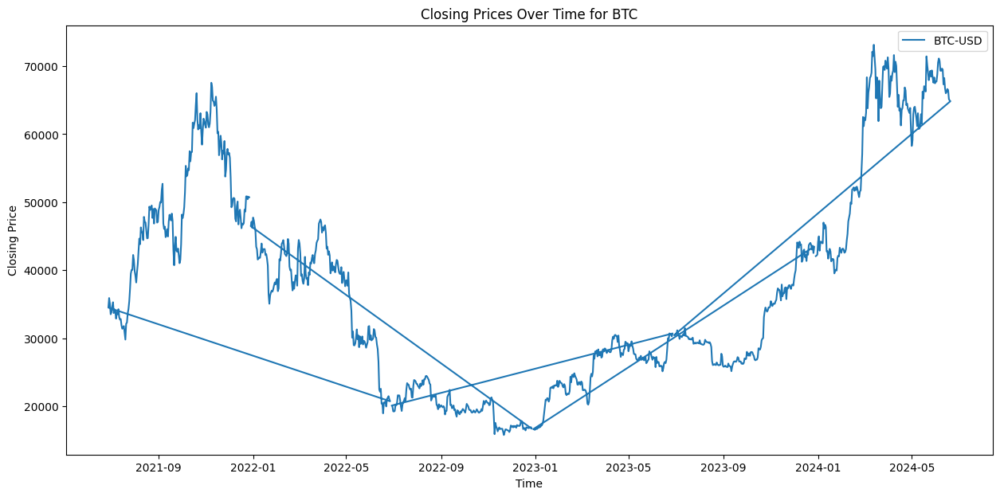

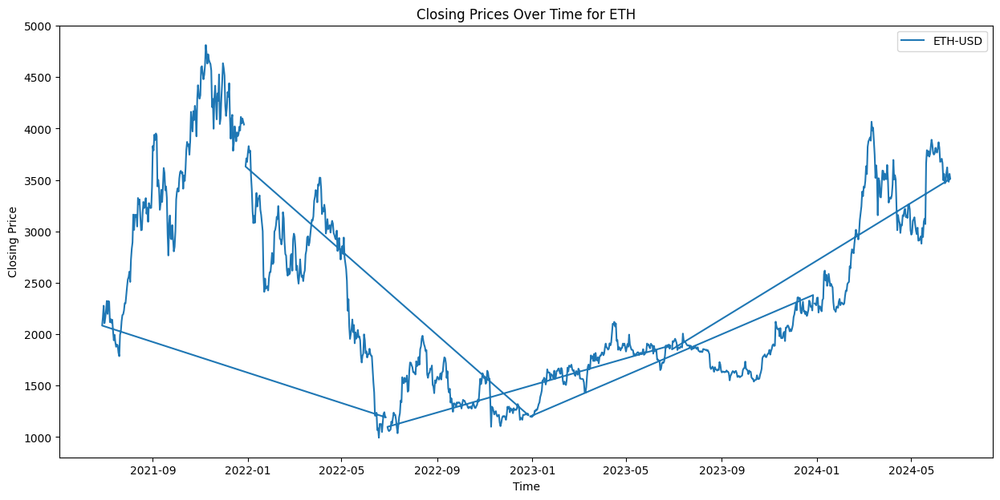

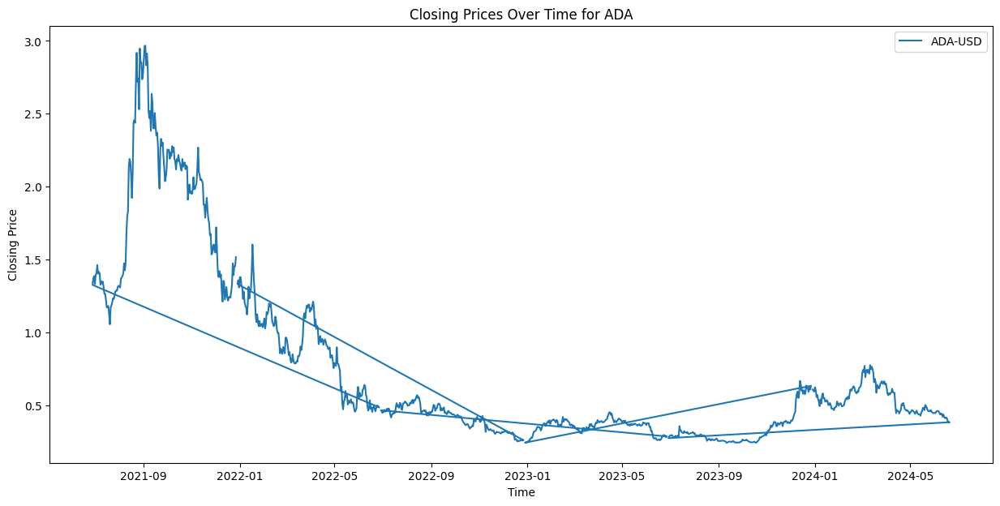

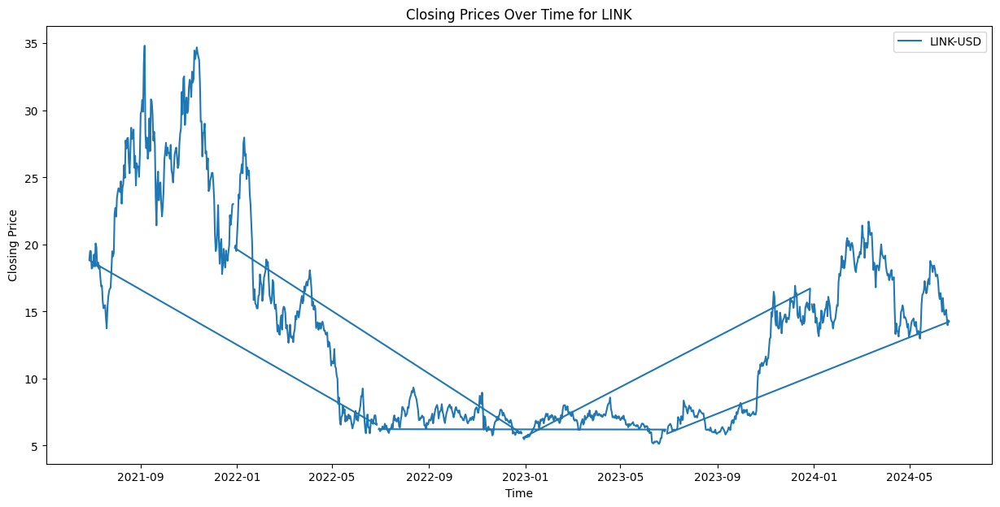

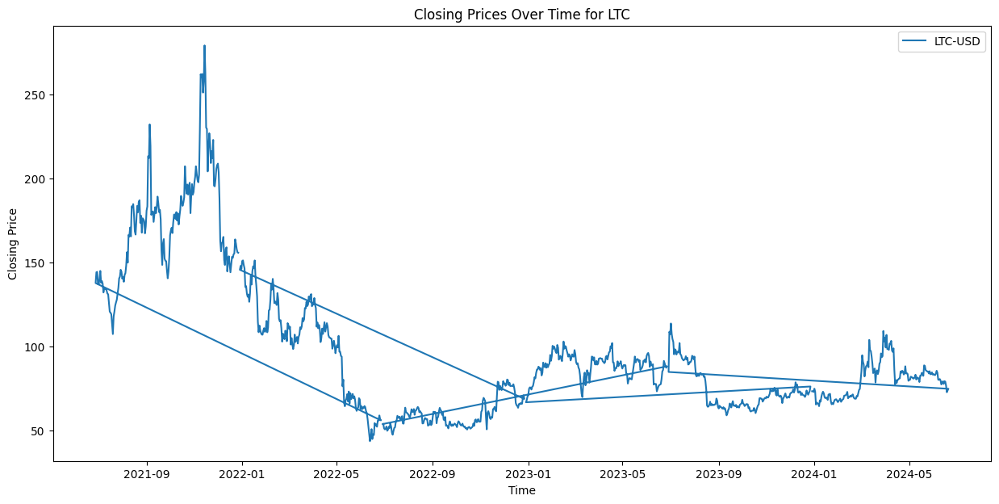

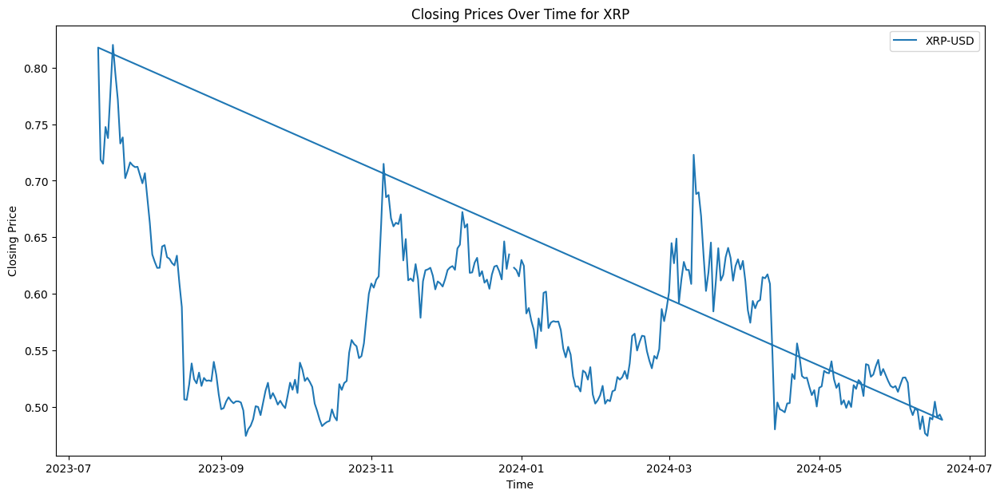

In [22]:
# Line plot for closing prices
def plotClosingPrices(name, data):
    plt.figure(figsize=(15, 7))
    for product in data['product_id'].unique():
        product_data = data[data['product_id'] == product]
        plt.plot(product_data['time'], product_data['close'], label=product)
    plt.title(f'Closing Prices Over Time for {name}')
    plt.xlabel('Time')
    plt.ylabel('Closing Price')
    plt.legend()
    plt.show()
    
for name, df in cryptos_info.items():
    plotClosingPrices(name, df)
    

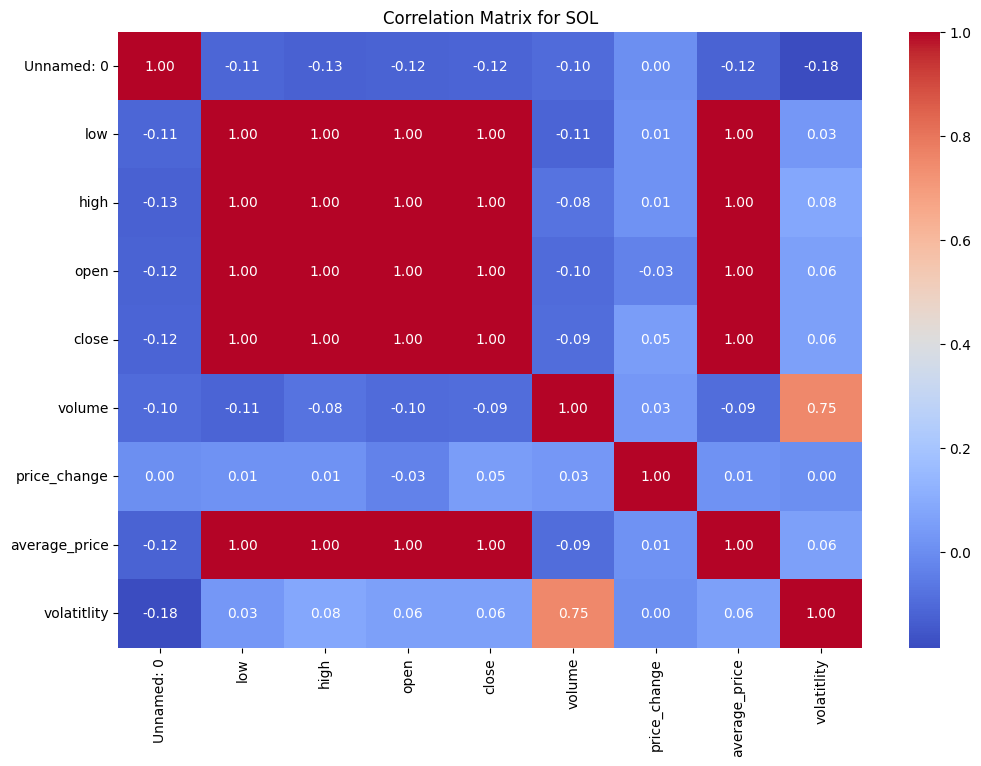

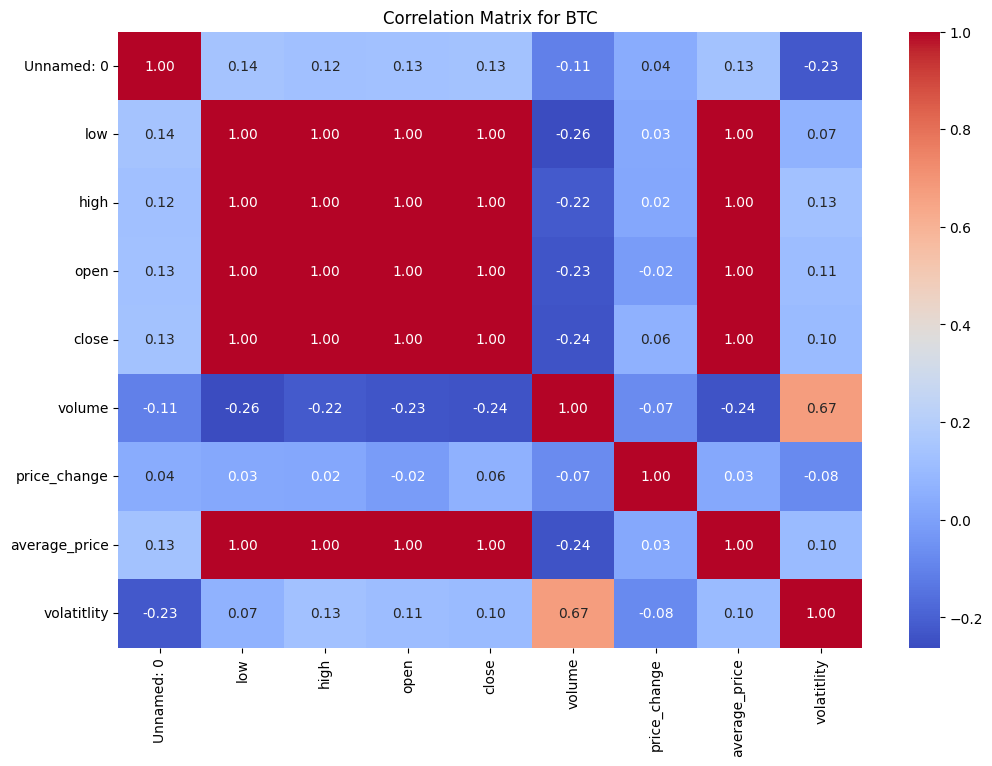

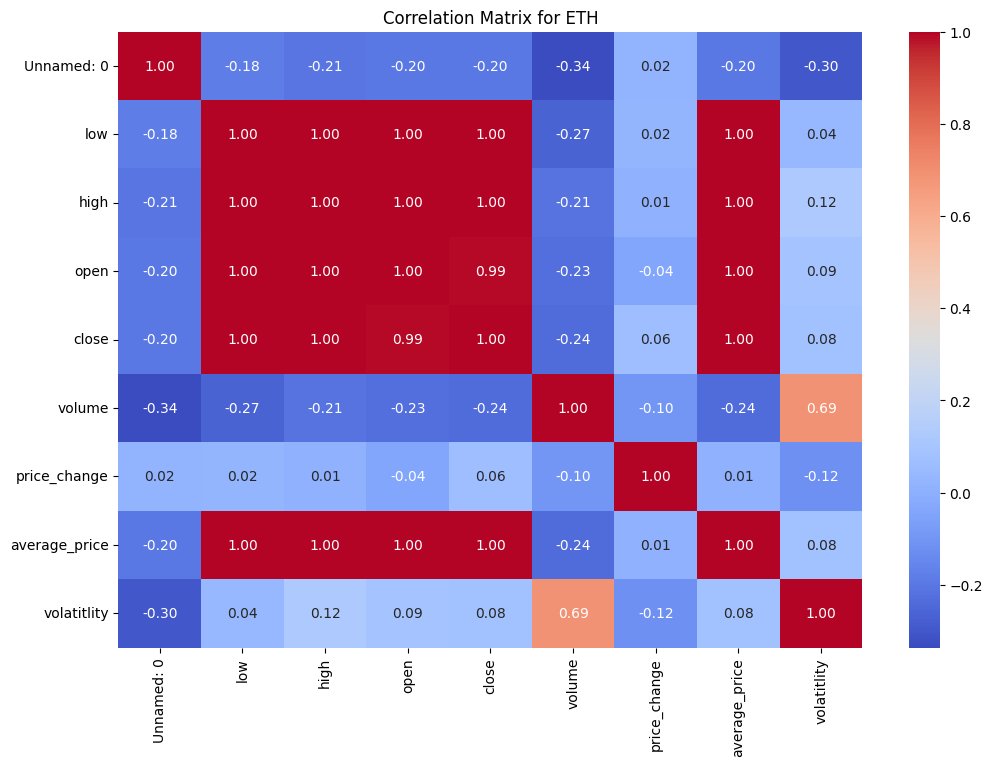

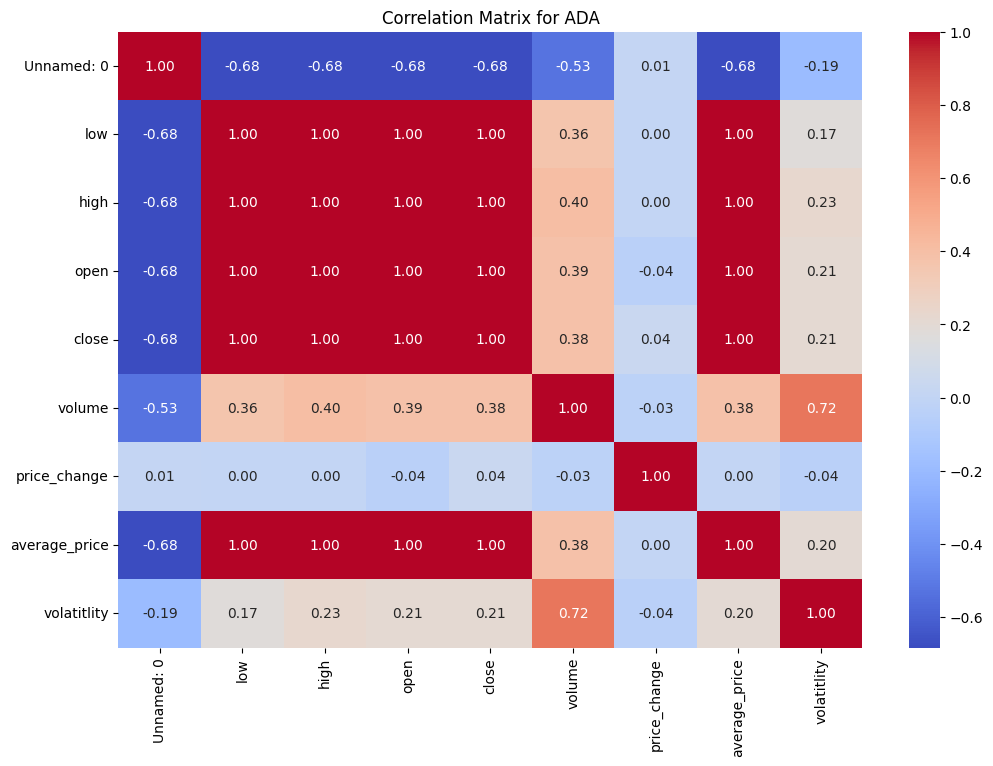

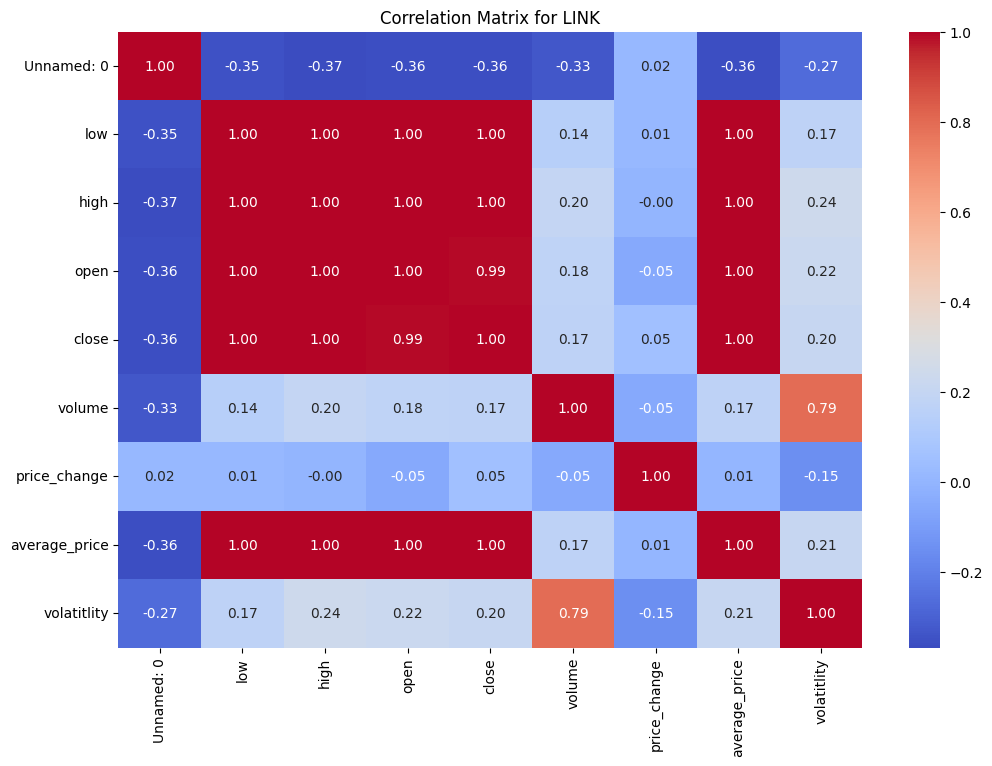

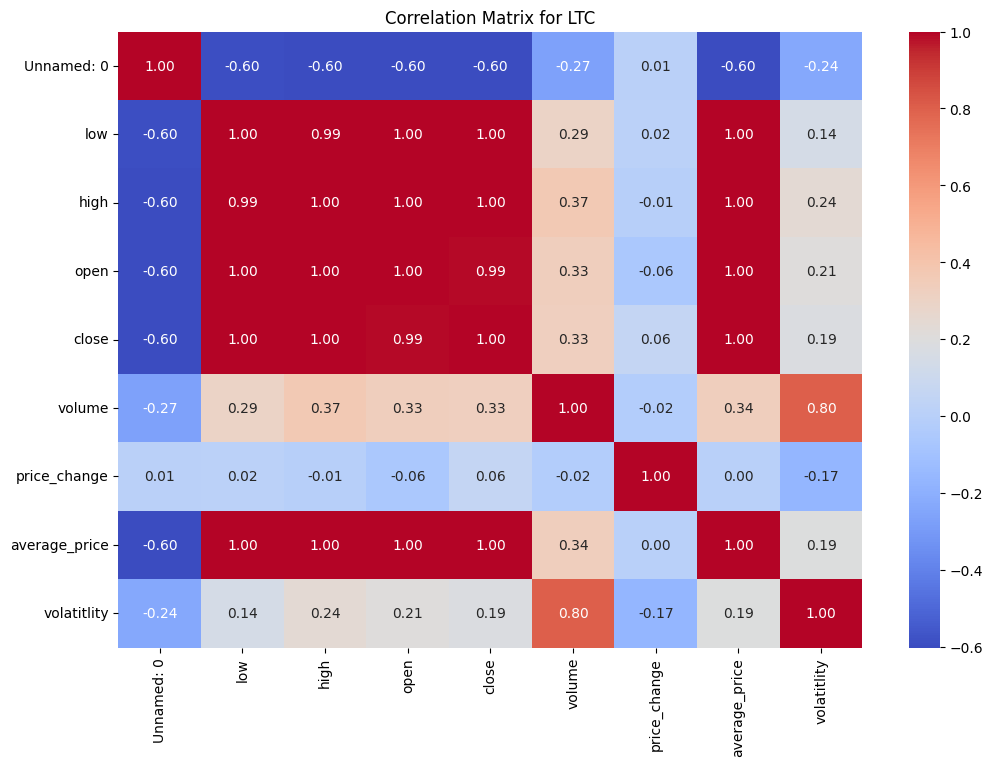

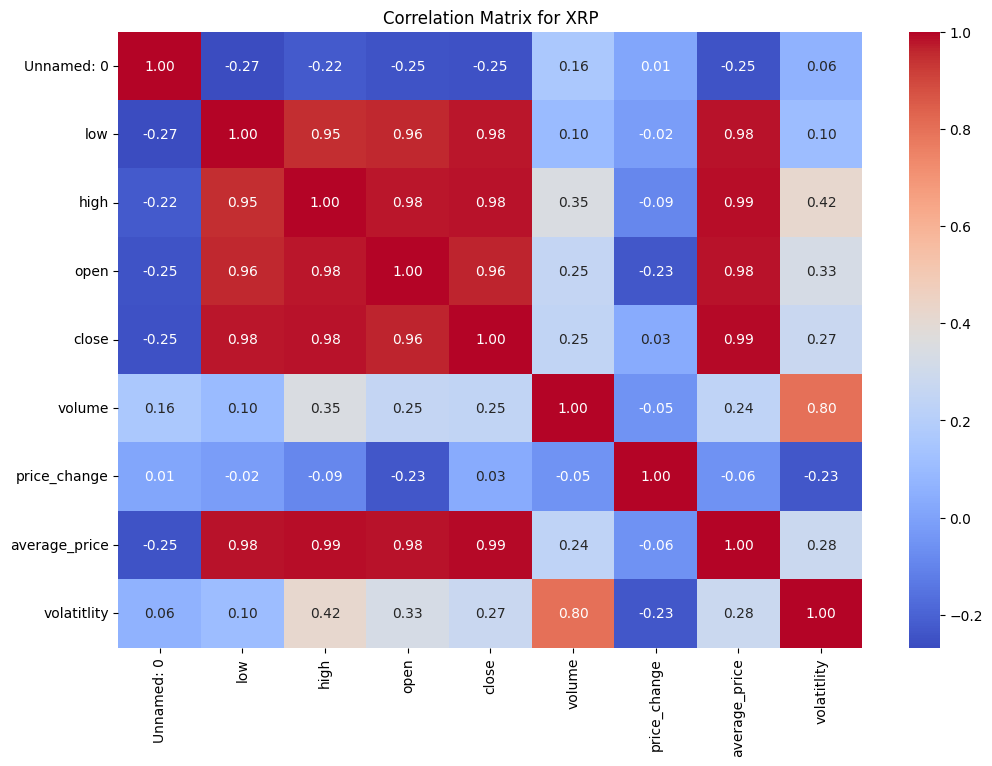

In [23]:
# Correlation Matrix excluding non-numeric columns
def plotCorrelationMatrix(name, cryptoData):
    numeric_data = cryptoData.select_dtypes(include=['float64', 'int64'])
    corr_matrix = numeric_data.corr()
    plt.figure(figsize=(12, 8))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
    plt.title(f'Correlation Matrix for {name}')
    plt.show()
for name, df in cryptos_info.items():
    plotCorrelationMatrix(name, df)

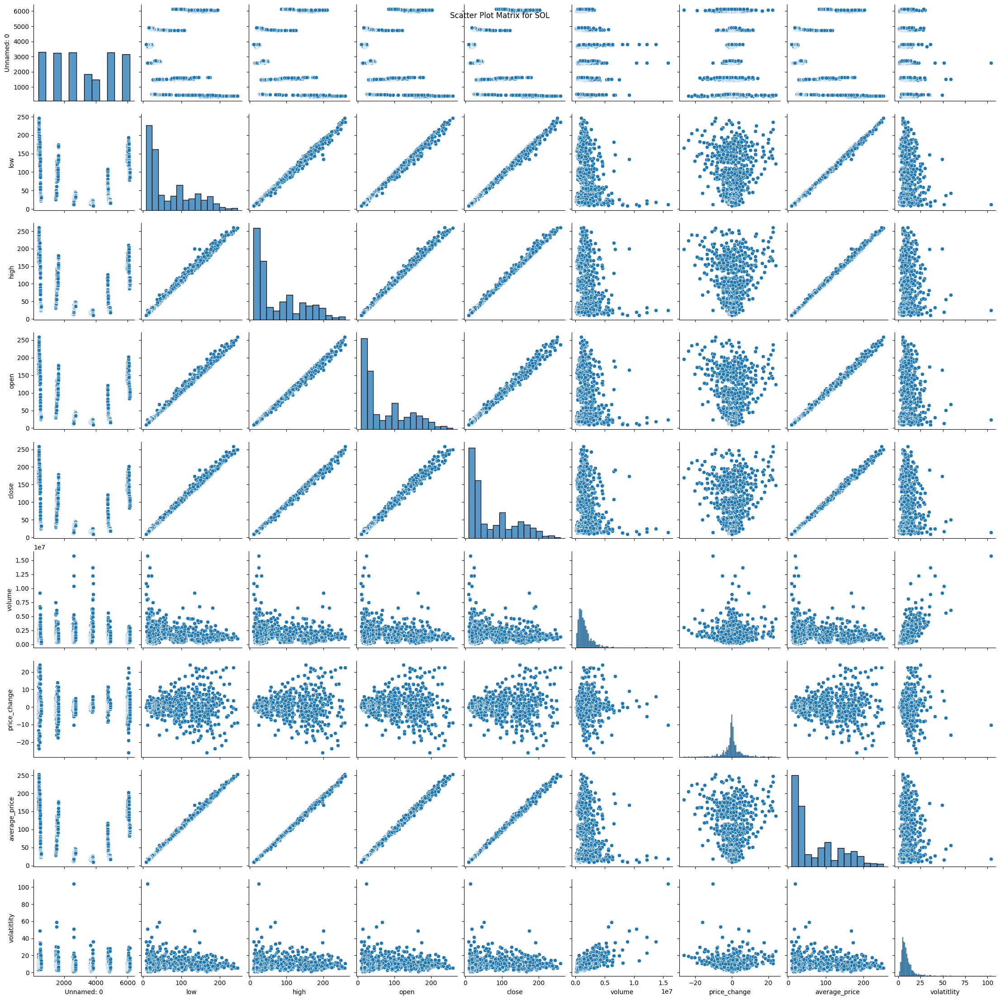

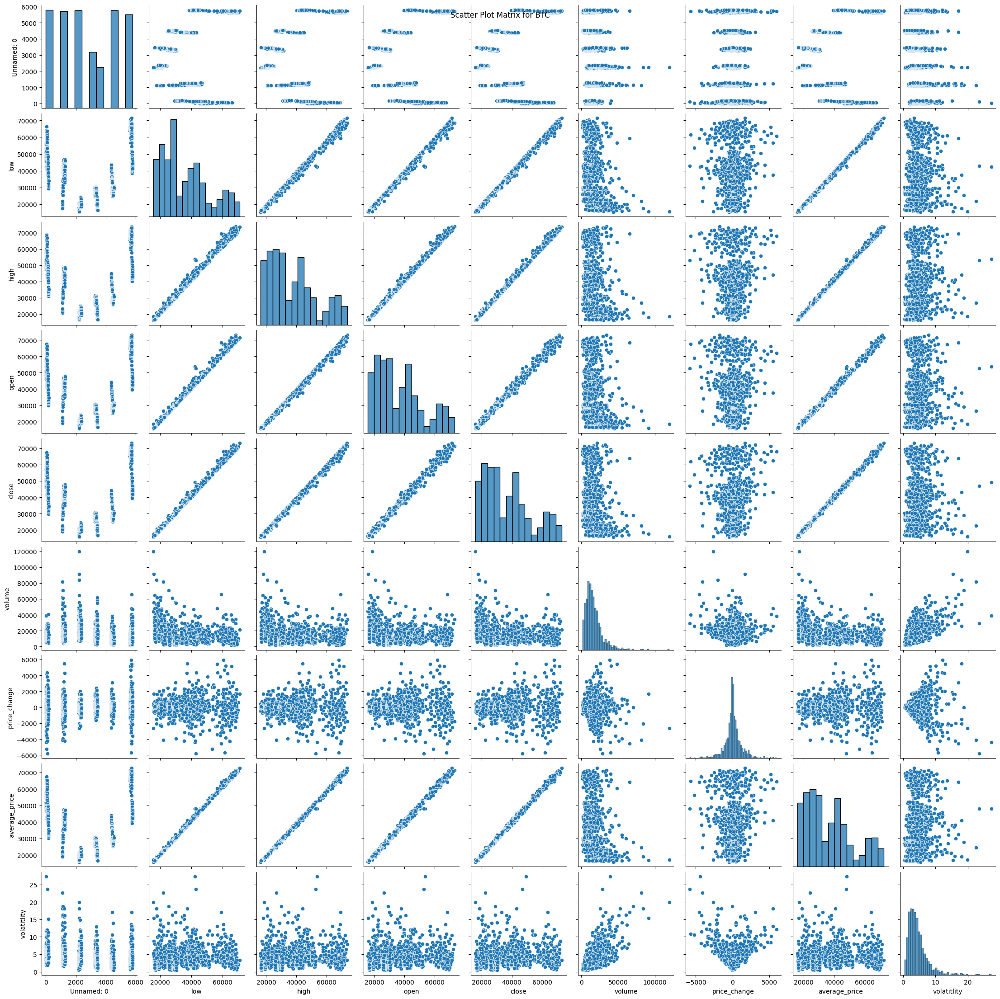

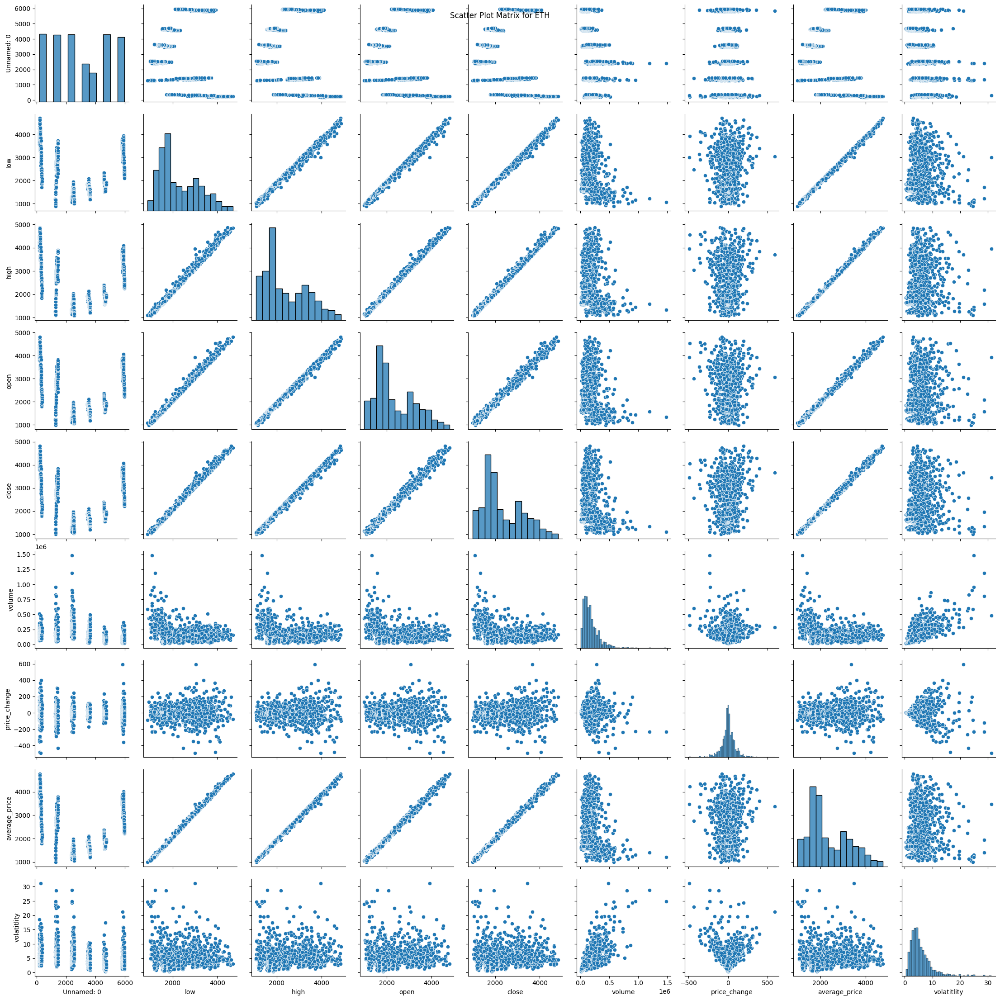

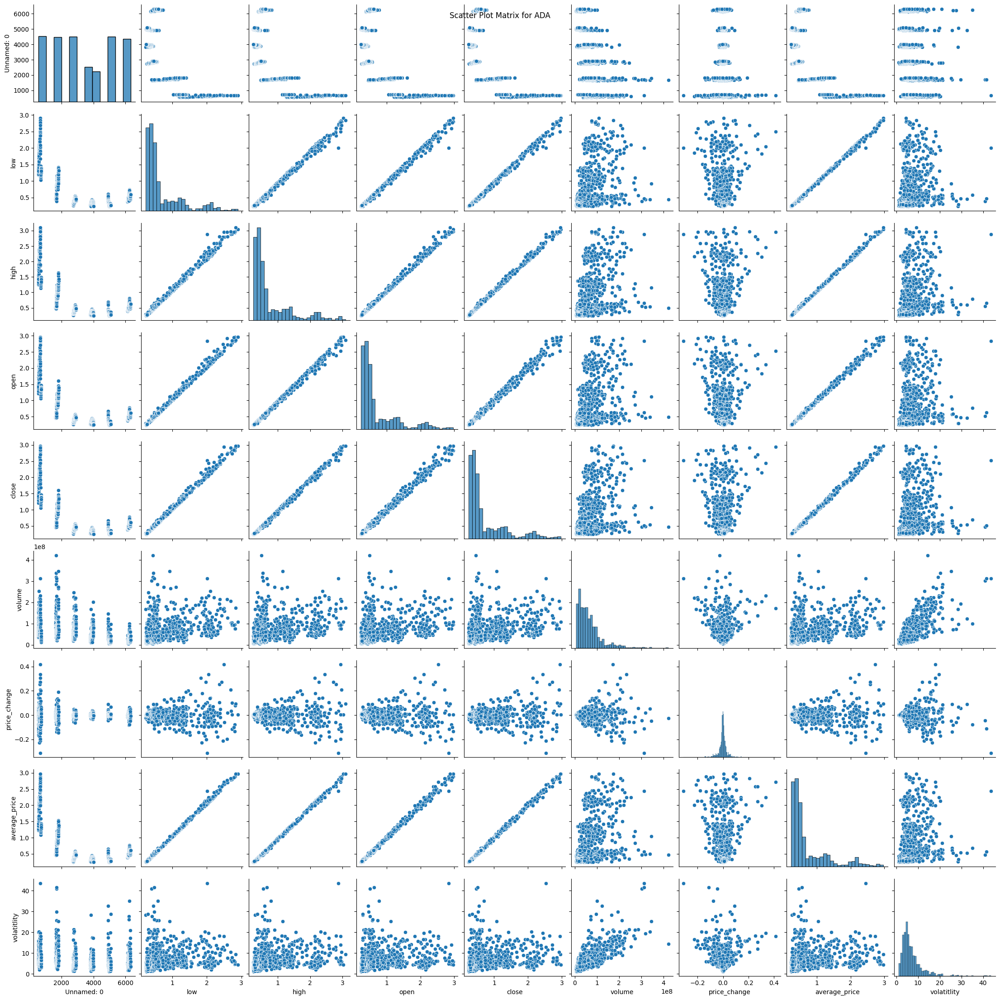

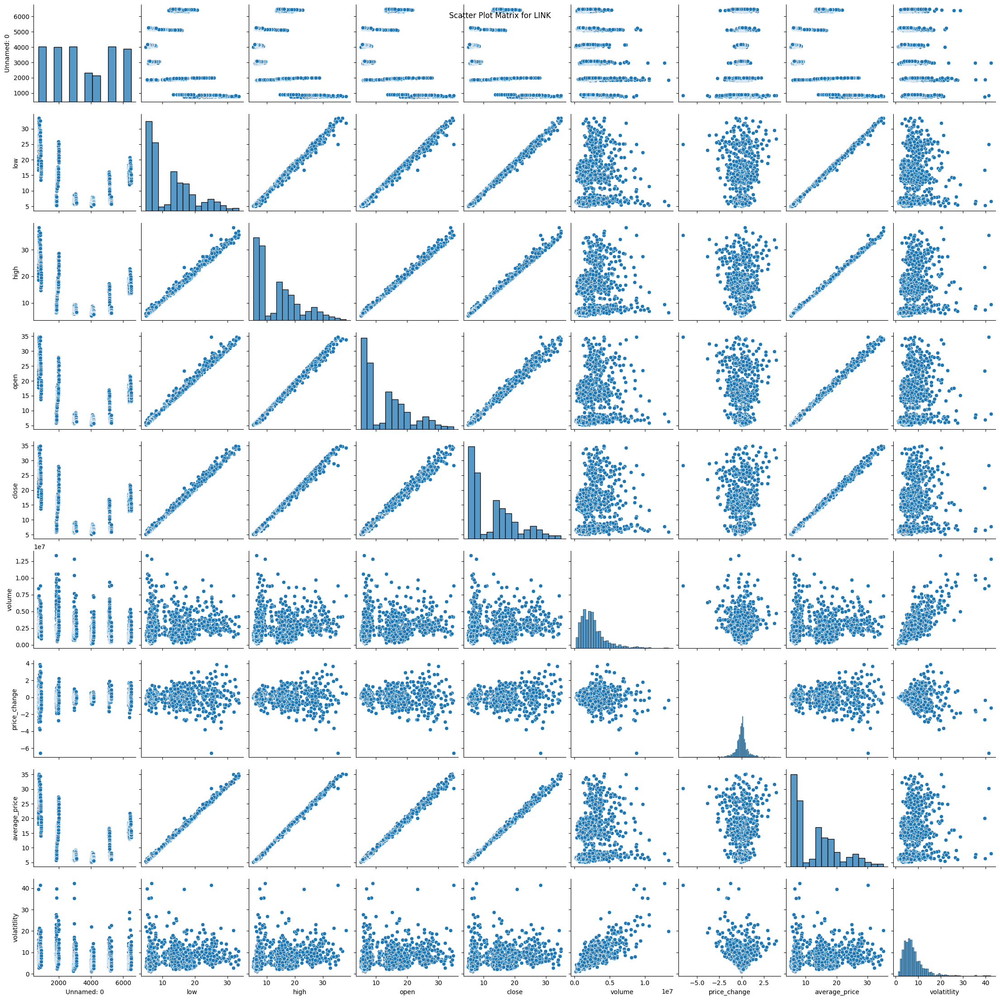

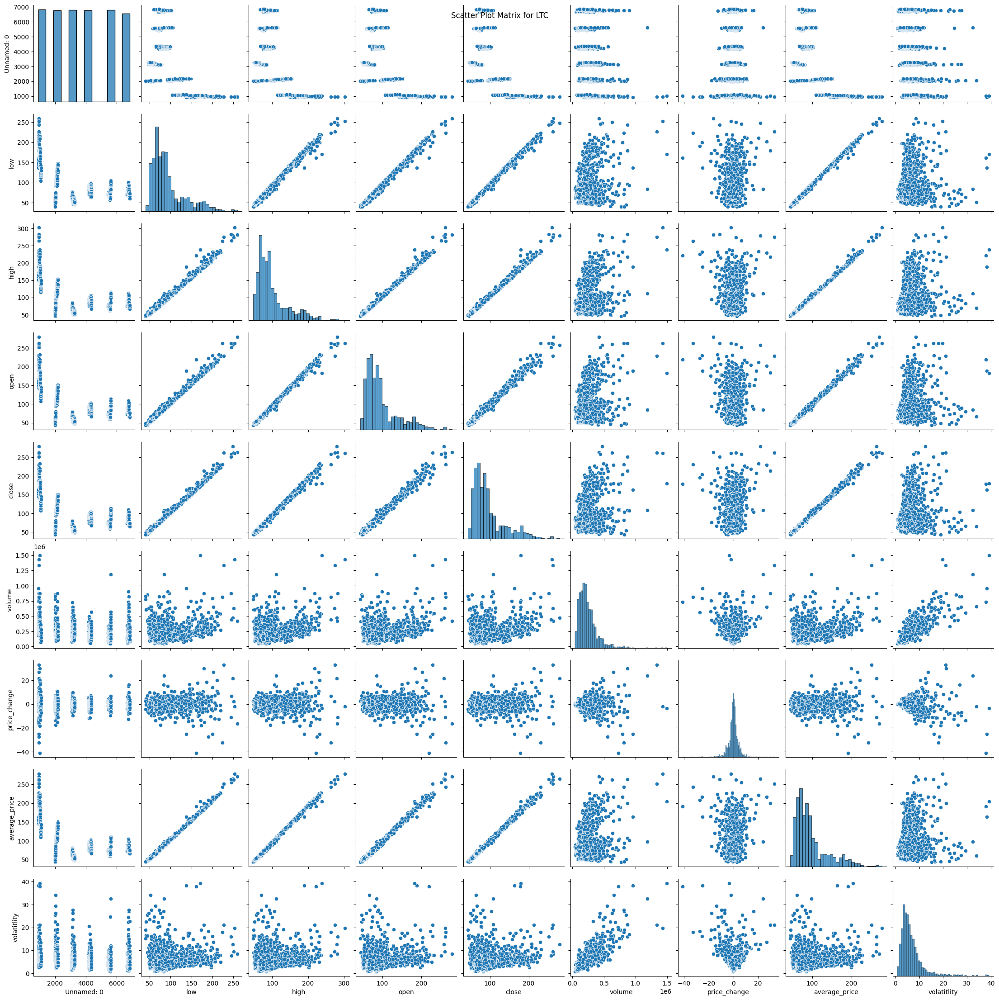

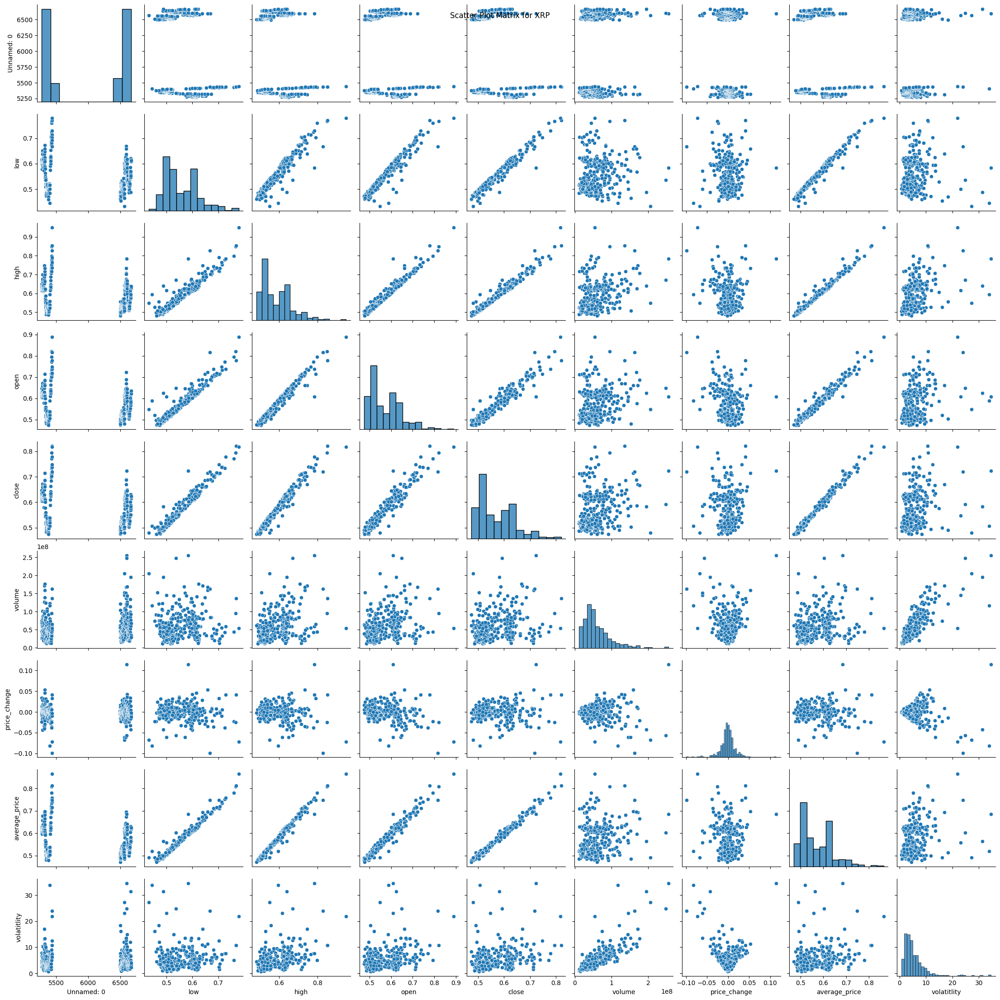

In [24]:
# Scatter plot matrix
def plotScatterMatrix(name, cryptoData):
    sns.pairplot(cryptoData)
    plt.suptitle(f'Scatter Plot Matrix for {name}')
    plt.show()
    
for name, df in cryptos_info.items():
    plotScatterMatrix(name, df)

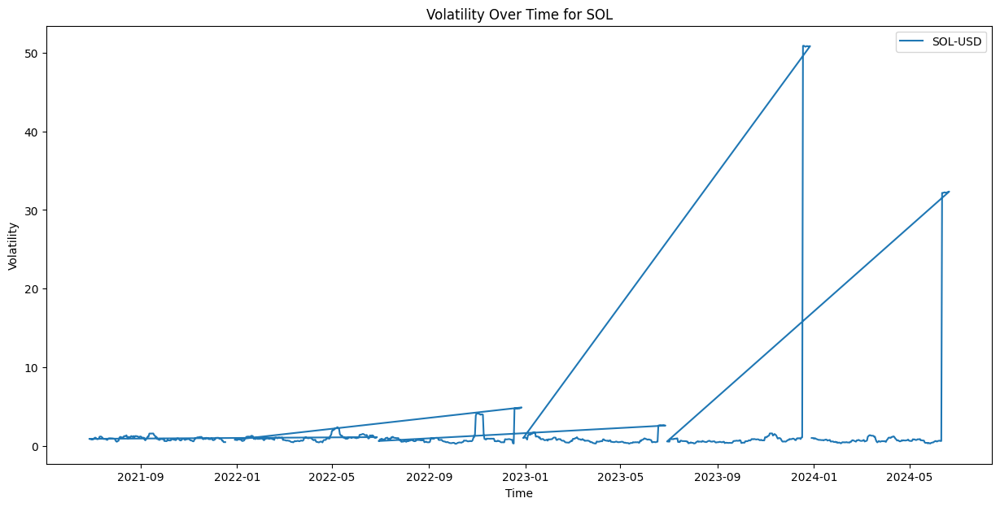

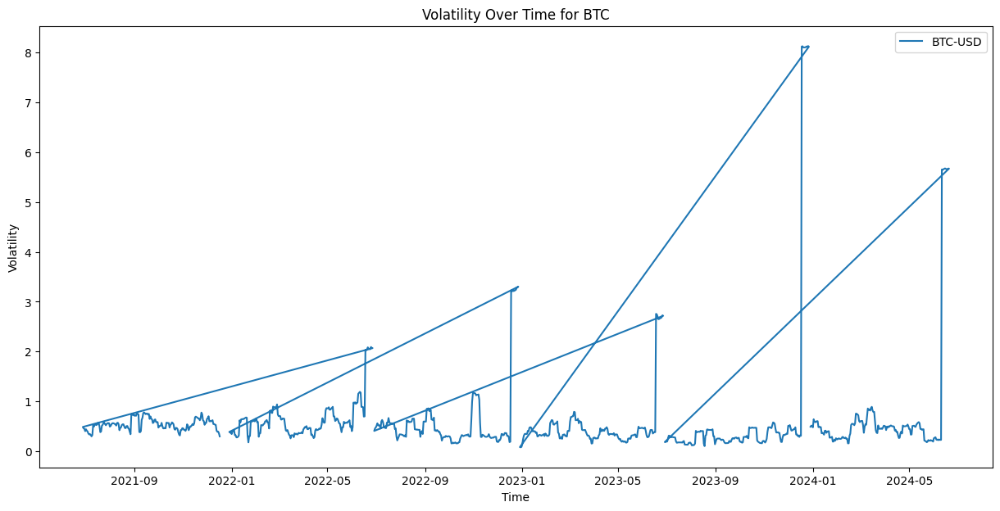

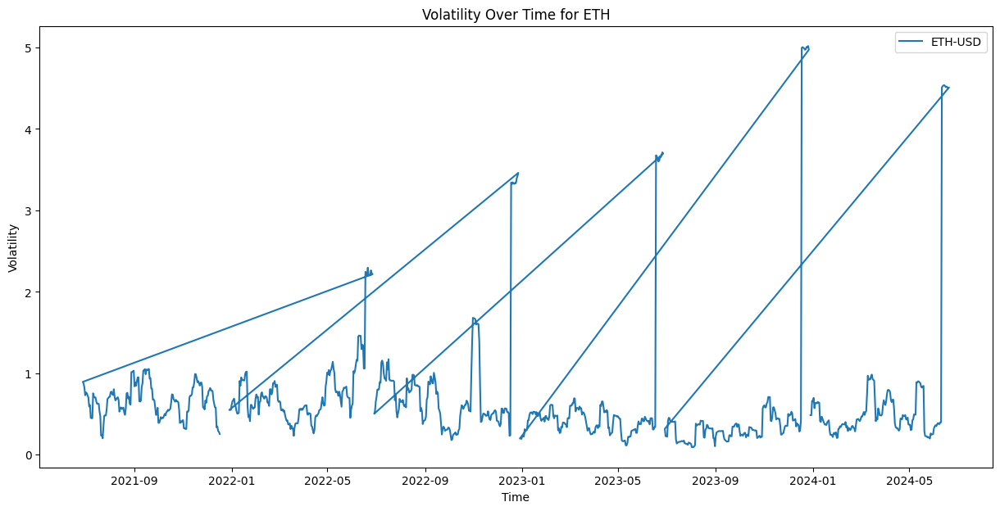

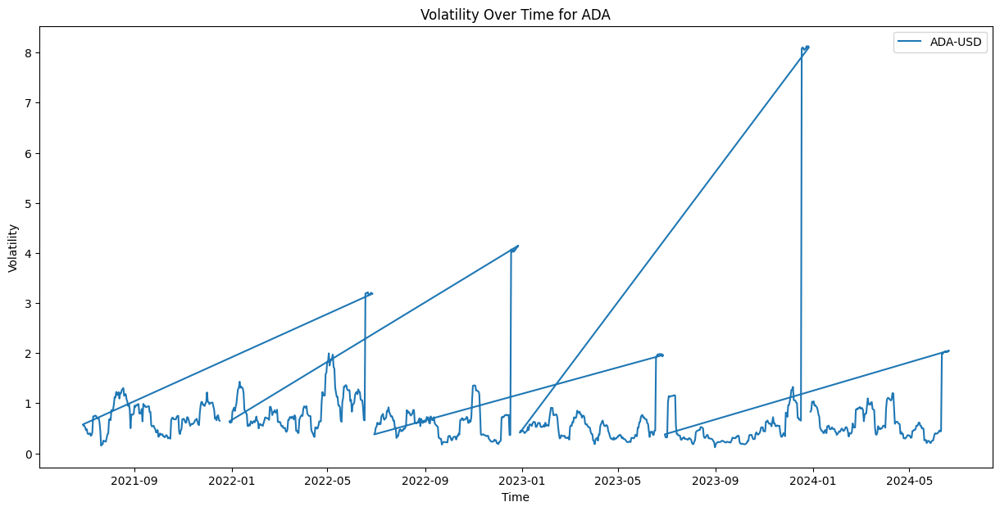

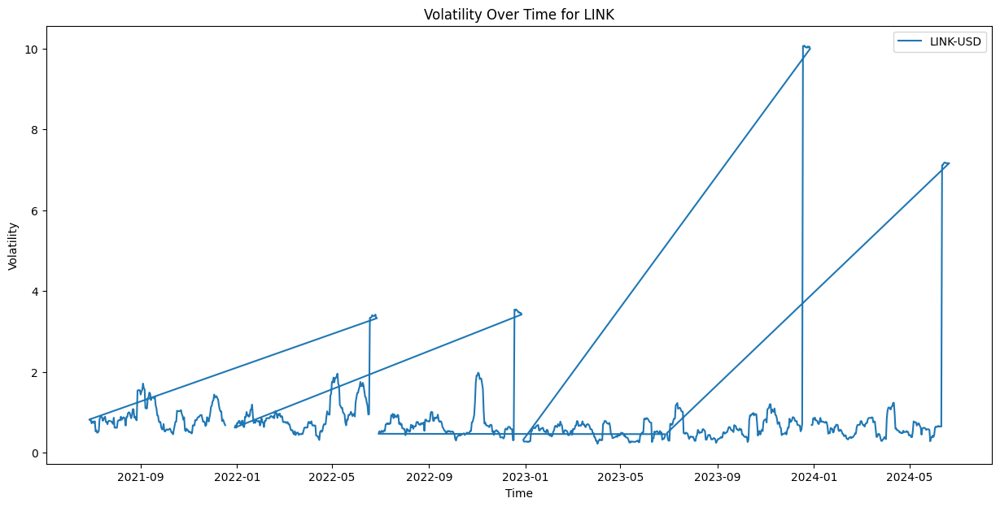

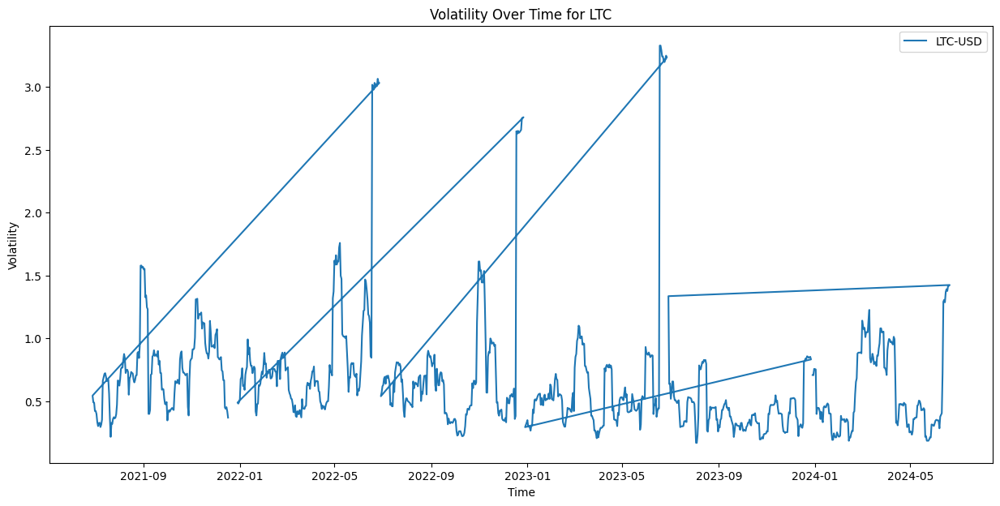

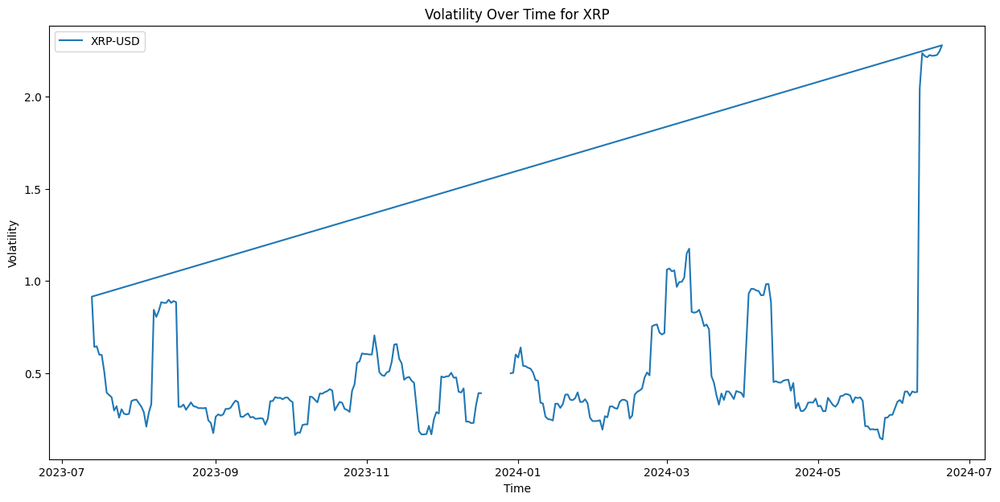

In [27]:

def calculateVolatility(cryptoData):
    # Calculate volatility if not present
    if 'volatility' not in cryptoData.columns:
        cryptoData.loc[:, 'volatility'] = cryptoData['close'].pct_change().rolling(window=10).std() * (252**0.5)

def plotVolatilityOverTime(name, data):
    # Plot volatility over time
    calculateVolatility(data)
    plt.figure(figsize=(15, 7))
    for product in data['product_id'].unique():
        product_data = data[data['product_id'] == product]
        plt.plot(product_data['time'], product_data['volatility'], label=product)
    plt.title(f'Volatility Over Time for {name}')
    plt.xlabel('Time')
    plt.ylabel('Volatility')
    plt.legend()
    plt.show()
    
for name, df in cryptos_info.items():
    plotVolatilityOverTime(name, df)

#### Data Preprocessing

In [ ]:
data

In [ ]:
# Drop the 'Unnamed: 0' column if it's not useful
data.drop(columns=['Unnamed: 0'], inplace=True)

In [ ]:
# Feature Engineering: Create moving averages and lag features
data['moving_avg_7'] = data['close'].rolling(window=7).mean()
data['moving_avg_30'] = data['close'].rolling(window=30).mean()

In [ ]:
# Create lag features
for lag in range(1, 8):
    data[f'lag_{lag}'] = data['close'].shift(lag)

In [ ]:
# Drop rows with NaN values created by rolling and shifting
data.dropna(inplace=True)

In [ ]:
# Select features and target
features = data.drop(columns=['time', 'product_id', 'close'])
target = data['close']

In [ ]:

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

# Normalize the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Display the shape of the training and test sets
print(f"Training set shape: {X_train_scaled.shape}")
print(f"Test set shape: {X_test_scaled.shape}")

In [ ]:
# Convert the scaled features back to a DataFrame for easier plotting
X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=features.columns)

# Plot the distribution of features before normalization
plt.figure(figsize=(15, 10))
for i, column in enumerate(features.columns, 1):
    plt.subplot(4, 4, i)
    plt.hist(X_train[column], bins=50, alpha=0.5, label='Original')
    plt.title(column)
    plt.xlabel('Value')
    plt.ylabel('Frequency')
plt.tight_layout()
plt.suptitle('Feature Distribution Before Normalization', y=1.02)
plt.show()


#### Model Training

##### Baseline Model: Linear Regression

In [ ]:
# Train a Linear Regression model
lr_model = LinearRegression()
lr_model.fit(X_train_scaled, y_train)

# Make predictions
y_pred_lr = lr_model.predict(X_test_scaled)

# Evaluate the model
mae_lr = mean_absolute_error(y_test, y_pred_lr)
rmse_lr = mean_squared_error(y_test, y_pred_lr, squared=False)
r2_lr = r2_score(y_test, y_pred_lr)

print(f'Linear Regression MAE: {mae_lr}')
print(f'Linear Regression RMSE: {rmse_lr}')
print(f'Linear Regression R-squared: {r2_lr}')

##### Advanced Model: Random Forest

In [ ]:
# Train a Random Forest model
rf_model = RandomForestRegressor(random_state=42)
rf_model.fit(X_train_scaled, y_train)

# Hyperparameter tuning using GridSearchCV
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [None, 10, 20, None],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

grid_search = GridSearchCV(estimator=rf_model, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2)
grid_search.fit(X_train_scaled, y_train)

best_rf_model = grid_search.best_estimator_

# Make predictions with the best model
y_pred_rf = best_rf_model.predict(X_test_scaled)

# Evaluate the Random Forest model
mae_rf = mean_absolute_error(y_test, y_pred_rf)
rmse_rf = mean_squared_error(y_test, y_pred_rf, squared=False)
r2_rf = r2_score(y_test, y_pred_rf)

print(f'Random Forest MAE: {mae_rf}')
print(f'Random Forest RMSE: {rmse_rf}')
print(f'Random Forest R-squared: {r2_rf}')

##### Advanced Model: Gradient Boosting

In [ ]:
# Train a Gradient Boosting model
gb_model = GradientBoostingRegressor(random_state=42)
gb_model.fit(X_train_scaled, y_train)

# Make predictions
y_pred_gb = gb_model.predict(X_test_scaled)

# Evaluate the Gradient Boosting model
mae_gb = mean_absolute_error(y_test, y_pred_gb)
rmse_gb = mean_squared_error(y_test, y_pred_gb, squared=False)
r2_gb = r2_score(y_test, y_pred_gb)

print(f'Gradient Boosting MAE: {mae_gb}')
print(f'Gradient Boosting RMSE: {rmse_gb}')
print(f'Gradient Boosting R-squared: {r2_gb}')

#### Model Evaluation

In [ ]:
# Plot actual vs. predicted values
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_rf, alpha=0.3, label='Predictions')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2, label='Ideal')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs. Predicted Values (Random Forest)')
plt.legend()
plt.show()

In [ ]:
# Plot residuals
residuals = y_test - y_pred_rf
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_rf, residuals, alpha=0.3)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot (Random Forest)')
plt.show()

In [ ]:
# Feature importance
importances = best_rf_model.feature_importances_
indices = np.argsort(importances)[::-1]

# Plot feature importance
plt.figure(figsize=(12, 6))
plt.title("Feature Importance (Random Forest)")
plt.bar(range(X_train.shape[1]), importances[indices], align="center")
plt.xticks(range(X_train.shape[1]), [features.columns[i] for i in indices], rotation=90)
plt.show()

In [ ]:
# Explain the model's predictions using SHAP values
explainer = shap.TreeExplainer(best_rf_model)
shap_values = explainer.shap_values(X_test_scaled)

# Summary plot of SHAP values
shap.summary_plot(shap_values, X_test, feature_names=features.columns)

##### Comparison of Models

In [ ]:
# Initialize a dictionary to store the results
results = {}
results['Linear Regression'] = {'MAE': mae_lr, 'RMSE': rmse_lr, 'R-squared': r2_lr}
results['Random Forest'] = {'MAE': mae_rf, 'RMSE': rmse_rf, 'R-squared': r2_rf}
results['Gradient Boosting'] = {'MAE': mae_gb, 'RMSE': rmse_gb, 'R-squared': r2_gb}

# Display the results
results_df = pd.DataFrame(results).T
print(results_df)

In [ ]:
# Plot actual vs. predicted values for Gradient Boosting
y_pred_best = y_pred_gb  # Predictions from the best model (Gradient Boosting)
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_best, alpha=0.3, label='Predictions')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'k--', lw=2, label='Ideal')
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs. Predicted Values (Best Model: Gradient Boosting)')
plt.legend()
plt.show()

# Plot residuals for Gradient Boosting
residuals_best = y_test - y_pred_best
plt.figure(figsize=(10, 6))
plt.scatter(y_pred_best, residuals_best, alpha=0.3)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('Predicted Values')
plt.ylabel('Residuals')
plt.title('Residual Plot (Best Model: Gradient Boosting)')
plt.show()


In [ ]:
# Feature importance for the best model (Gradient Boosting)
importances = gb_model.feature_importances_
indices = np.argsort(importances)[::-1]

plt.figure(figsize=(12, 6))
plt.title("Feature Importance (Gradient Boosting)")
plt.bar(range(X_train.shape[1]), importances[indices], align="center")
plt.xticks(range(X_train.shape[1]), [features.columns[i] for i in indices], rotation=90)
plt.show()


In [ ]:
# Explain the model's predictions using SHAP values
explainer = shap.TreeExplainer(gb_model)
shap_values = explainer.shap_values(X_test_scaled)

# Summary plot of SHAP values
shap.summary_plot(shap_values, X_test, feature_names=features.columns)
